E:\UNI\D_Drive\PhD\Year_1\2021_02_05_OwnOEDmcPaper\Scripts\PLac

# Import all packages

In [1]:
using DifferentialEquations
using OrdinaryDiffEq
using DiffEqBase
using Sundials
using ODEInterfaceDiffEq
using Plots
using Measures
using CSV
using DataFrames
using Turing
using MCMCChains
using EasyFit
using StatsPlots
using LinearAlgebra
using Random
using Distributions
using OrdinaryDiffEq
Random.seed!(145975);
using CmdStan
using KernelDensity
using LaTeXStrings
using StatsBase
using JLD2
using BlackBoxOptim
using BlackBoxOptim: num_func_evals
using HypothesisTests
using BayesianOptimization, GaussianProcesses

set_cmdstan_home!("C:\\cmdstan\\cmdstan-2.30.0");

┌ Warning: Environment variable CMDSTAN_HOME not set. Use set_cmdstan_home!.
└ @ CmdStan C:\Users\dgomez\.julia\packages\CmdStan\2vwWj\src\CmdStan.jl:27


In [2]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\FunctionsBayesInfs.jl")
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\ModelFunctionsAll.jl")
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\FunctionsBayesOED.jl")

redSamples (generic function with 2 methods)

# Define True Theta and Bounds

In [3]:
trueP = [48.0, 55.0,0.005911,0.01832,0.042171,0.5365,0.98047,0.991257,0.93335,0.008241,0.9943848,0.001974,   15];

bounds = [[48, 55, 0.001, 0.005, 0.01, 0.1, 0.7, 0.7, 0.7, 0.005, 0.7, 0.0008, 15],
          [48, 55, 0.01, 0.05, 0.08, 0.8, 1.2, 1.2, 1.2, 0.012, 1.2, 0.005, 15]];


InitsY0 = [450, 12599, 226];

boundY0 = [[300, 7000, 100],
           [1000, 25000, 1000]];

# Perform OEDmc

## Get Prior Samples

In [4]:
NSamps = 1000;

priorTheta = Array{Any}(undef, 13);
priotY0 = Array{Any}(undef, 3);

priorTheta[1] = Normal(40.92, 10); priorTheta[2] = Normal(51.23, 10); priorTheta[3] = Truncated(Normal(0.0055, 0.00275), 0,2); priorTheta[4] = Truncated(Normal(0.0275, 0.01375), 0,2); 
priorTheta[5] = Truncated(Normal(0.045, 0.0225), 0,2); priorTheta[6] = Truncated(Normal(0.45, 0.225), 0,2); priorTheta[7] = Truncated(Normal(0.95, 0.475), 0,2); 
priorTheta[8] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[9] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[10] = Truncated(Normal(0.0085, 0.00425), 0,2);
priorTheta[11] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[12] = Truncated(Normal(0.0029, 0.00145), 0,2); priorTheta[13] = Normal(18.5, 2.29);

priotY0[1] = Truncated(Normal(650, 260), 0, 1600); priotY0[2] = Truncated(Normal(16000, 6400), 0, 4e4); priotY0[3] = Truncated(Normal(550, 275), 0, 1600);
global sampsTh = zeros(NSamps, 13);
global sampsY0 = zeros(NSamps, 3);

Random.seed!(687865443); 

for i in 1:13
    sampsTh[:,i] = rand(priorTheta[i], NSamps);
end
for i in 1:3
    sampsY0[:,i] = rand(priotY0[i], NSamps);
end
sampsTh[:,1] .= 48;
sampsTh[:,2] .= 55;
sampsTh[:,13] .= 15;

# CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PriorRED_CompetitiveRepression_OED1.csv", DataFrame(hcat(sampsTh, sampsY0), :auto))

1000-element view(::Matrix{Float64}, :, 13) with eltype Float64:
 15.0
 15.0
 15.0
 15.0
 15.0
 15.0
 15.0
 15.0
 15.0
 15.0
  ⋮
 15.0
 15.0
 15.0
 15.0
 15.0
 15.0
 15.0
 15.0
 15.0

In [5]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
global tsC2 = dat32mM[:,1]
global ts = 0:tsC2[end];
global samps = convert.(Int, tsC2);


In [6]:
CompRepUtil_Entro_OEDmc([15.0125])

323.9614254743213

## Optimisation 

In [7]:
steps = 1;

In [8]:
model = ElasticGPE(steps,                            # 4*2 input dimensions
           mean = MeanConst(0.),
           kernel = SEArd(zeros(steps), 3.),
           logNoise = 0.,
           capacity = 3000);

In [9]:
modeloptimizer = MAPGPOptimizer(every = 50, noisebounds = [-4, 3],       # bounds of the logNoise
                               kernbounds = [[-1*ones(steps); 0], [4*ones(steps); 10]],  # bounds of the 3 parameters GaussianProcesses.get_param_names(model.kernel)
                               maxeval = 50);

┌ Warning: use values(kwargs) and keys(kwargs) instead of kwargs.data and kwargs.itr
│   caller = #MAPGPOptimizer#19 at gp.jl:37 [inlined]
└ @ Core C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\models\gp.jl:37


In [10]:
opt = BOpt(CompRepUtil_Entro_OEDmc,
          model,
          ExpectedImprovement(),                   # type of acquisition            UpperConfidenceBound
          modeloptimizer,
          [0.1],[40.], # lowerbounds, upperbounds
          repetitions = 1,                          # evaluate the function for each input 1 times
          maxiterations = 500,                      # evaluate at 50 input positions
          sense = Max,  
                                      # maximise the function
          acquisitionoptions = (method = :LD_LBFGS, # run optimization of acquisition function with NLopts :LD_LBFGS method
                restarts = 2,       # run the NLopt method from 5 random initial conditions each time.
                maxtime = 0.1,      # run the NLopt method for at most 0.1 second each time
                maxeval = 1000),    # run the NLopt methods for at most 1000 iterations (for other options see https://github.com/JuliaOpt/NLopt.jl
          verbosity = Progress);

In [33]:
result = boptimize!(opt)

┌ Info: 2024-07-24T19:33:23.684	iteration: 5	current optimum: 353.36003086869925
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-07-24T19:33:33.554	iteration: 6	current optimum: 353.36003086869925
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-07-24T19:33:37.785	iteration: 7	current optimum: 358.78747665964835
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-07-24T19:33:42.552	iteration: 8	current optimum: 358.78747665964835
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-07-24T19:33:47.418	iteration: 9	current optimum: 358.78747665964835
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-07

(observed_optimum = 402.68275487445857, observed_optimizer = [1.2126676986831815], model_optimum = 402.28482088555626, model_optimizer = [1.1656729404776953])

In [34]:
inputOED = result.observed_optimizer

1-element Vector{Float64}:
 1.2126676986831815

In [7]:
inputOED = 1.2126676986831815;

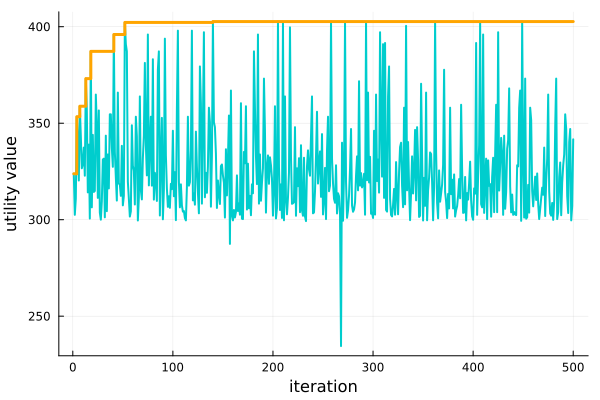

In [35]:
utilb = zeros(length(opt.model.y));
utilb[1] = opt.model.y[1];
for i in 2:length(opt.model.y)
    if opt.model.y[i]>=utilb[i-1]
        utilb[i] = opt.model.y[i];
    else
        utilb[i] = utilb[i-1];
    end
end

plot(opt.model.y, label = "", xlabel = "iteration", ylabel = "utility value", color="cyan3", linewidth = 2)
plot!(1:length(utilb), utilb, label = "", linetype=:step, color="orange", linewidth = 3)

### Save resutls

In [36]:
JLD2.save(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\OptimisationResults_Seq\\CR_SeqOED_OED1_OEDmc.jld"), "result", result, "inputOED",inputOED)

In [37]:
optres = Dict("acquisitionoptions"=>opt.acquisitionoptions,
                "duration"=>opt.duration,
#                 "func"=>opt.func,
#                 "initializer"=>opt.initializer,
#                 "iterations"=>opt.iterations,
#                 "iterations"=>opt.iterations,
#                 "lowerbounds"=>opt.lowerbounds,
#                 "model"=>opt.model,
                "model_optimizer"=>opt.model_optimizer,
                "model_optimum"=>opt.model_optimum,
                "modeloptimizer"=>opt.modeloptimizer,
                "observed_optimizer"=>opt.observed_optimizer,
                "observed_optimum"=>opt.observed_optimum,
#                 "opt"=>opt.opt,
                "repetitions"=>opt.repetitions,
                "sense"=>opt.sense,
#                 "timeroutput"=>opt.timeroutput,
                "upperbounds"=>opt.upperbounds,
#                 "verbosity"=>opt.verbosity,
                "modelX"=>Array(opt.model.x),
                "modelY"=>Array(opt.model.y));
JLD2.save(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\OptimisationResults_Seq\\CR_SeqOED_OED1_OEDmc2.jld"), optres)

## Generate Pseudo-Data

In [8]:
Nexp = 1;

ivss = [round(inputOED[1], digits = 1)*1000, 0, 0, InitsY0[1], InitsY0[2], InitsY0[3], 0, 0, 0, 0, 0, round(inputOED[1], digits = 1)*1000, 0, round(inputOED[1], digits = 1)*1000*(trueP[end]*0.12)]

SimulsAll = Array{Any}(undef, Nexp,3);
for i in 1:Nexp
    SimulsAll[i,1], SimulsAll[i,2], SimulsAll[i,3]  = PyruvateHP_NMR_SolveAllCp(ts, vcat(trueP, 0), ivss, samps);
end
ObsS = Array{Any}(undef, Nexp,2);
for i in 1:Nexp
    ObsS[i,1] = SimulsAll[i,1][:,14,1]; # Pyruvate HP
    ObsS[i,2] = SimulsAll[i,1][:,13,1]; # Lactate HP
end

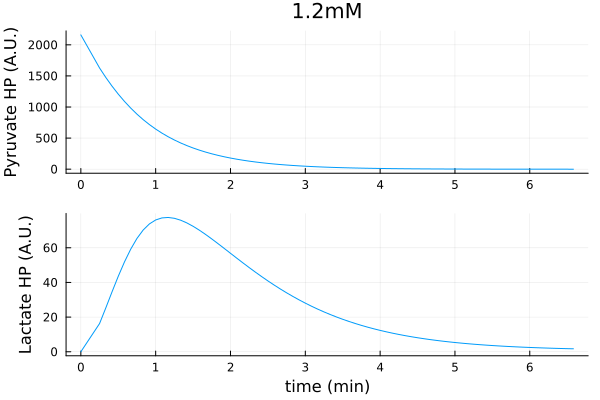

In [9]:
pp1 = plot(samps./60, ObsS[1,1], label = "", title = string(round(inputOED[1], digits = 1))*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, ObsS[1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

In [10]:
sigm1=0.12; # 10% additive heteroscedastic noise
sigm2=0.075;


Random.seed!(45659211); 

SolN1NoiseHet = zeros(length(samps),Nexp,2);
basemat = zeros(length(samps),Nexp,2);

i = 1

for i in 1:Nexp
    basemat[:,i,1] = ObsS[i,1]'.*sigm1; # introduce new diagonal matrices
    basemat[:,i,2] = ObsS[i,2]'.*sigm2;

    for zer in collect(1:length(samps)) # To avoid having standard deviations of 0
        if basemat[zer,i,1]<=1
            basemat[zer,i,1] = 1;
        end
        if basemat[zer,i,2]<=1
            basemat[zer,i,2] = 1;
        end
    end

    SolN1NoiseHet[:,i, 1] = ObsS[i,1]#+rand(MvNormal(zeros(length(samps)),basemat[:,i,1]));
    SolN1NoiseHet[:,i, 2] = ObsS[i,2]+rand(MvNormal(zeros(length(samps)),basemat[:,i,2]));
    SolN1NoiseHet[1,i, 2] = 0;
end

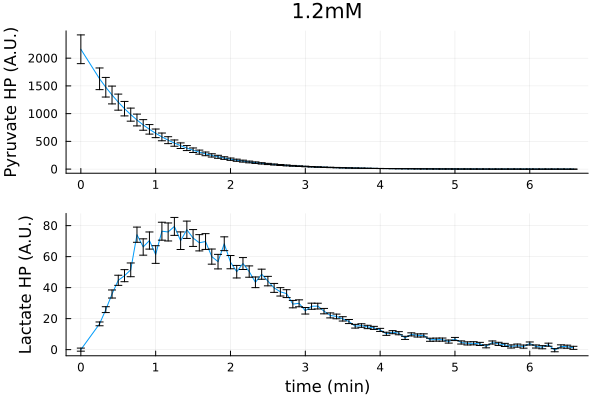

In [11]:
pp1 = plot(samps./60, SolN1NoiseHet[:,1, 1], yerror = basemat[:,1,1], label = "", title = string(round(inputOED[1], digits = 1))*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, SolN1NoiseHet[:,1, 2], yerror = basemat[:,1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

## Generate CSV Files For PseudoData

In [17]:
# Observables
for i in 1:Nexp
    Observables = zeros(length(samps),5);
    Observables[:,1] = samps;
    Observables[:,2] = SolN1NoiseHet[:,i, 1];
    Observables[:,3] = basemat[:,i, 1];
    Observables[:,4] = SolN1NoiseHet[:,i, 2];
    Observables[:,5] = basemat[:,i, 2];
    obs_head = ["time","Pyr_MEAN","Pyr_STD","Lac_MEAN","Lac_STD"];

    df1 = DataFrame(Observables, :auto);
    rename!(df1, [obs_head[i] for i in 1:5]);
    CSV.write(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\CompRepr_OED1_Observables_Pyr",string(round(inputOED[1], digits = 1)),"mM.csv"), df1);
end

# Bayesian Inference 1

## Extract Data

In [12]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\";
i = 1;
paths = [mainpath*"CompRepr_OED1_Observables_Pyr"*string(round(inputOED[1], digits = 1))*"mM.csv"]

1-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 74 bytes ⋯ "r_OED1_Observables_Pyr1.2mM.csv"

In [13]:
Random.seed!(8987654);
global dat = restructDatInfCompRep_FixedSF(paths, rand(Uniform(boundY0[1][1],boundY0[2][1])), rand(Uniform(boundY0[1][2],boundY0[2][2])), rand(Uniform(boundY0[1][3],boundY0[2][3])), 15)

Dict{String, Any} with 14 entries:
  "Means"  => [2160.0; 1627.91; … ; -0.720963; -0.749665;;; 0.0; 16.6216; … ; 1…
  "stsl"   => [78;;]
  "obSta"  => [1 2]
  "sts"    => [0; 15; … ; 390; 395;;]
  "obser"  => 2
  "Y0us"   => [1200.0; 0.0; … ; 0.0; 2160.0;;]
  "ts"     => [1.0e-20; 1.0; … ; 394.0; 395.0;;]
  "itp"    => [0.0]
  "ncells" => [0;;]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [259.2; 195.35; … ; 1.0; 1.0;;; 1.0; 1.22042; … ; 1.0; 1.0]
  "m"      => 1
  "nts"    => [395;;]

## Prior Prediction

In [14]:
priorTheta = Array{Any}(undef, 13);
priotY0 = Array{Any}(undef, 3);

priotY0[1] = Truncated(Normal(650, 260), 0, 1500);
priotY0[2] = Truncated(Normal(16000, 6400), 0, 4e4);
priotY0[3] = Truncated(Normal(550, 275), 0, 2000);

priorTheta[1] = Normal(40.92, 10); priorTheta[2] = Normal(51.23, 10); priorTheta[3] = Truncated(Normal(0.0055, 0.00275), 0,2); priorTheta[4] = Truncated(Normal(0.0275, 0.01375), 0,2); 
priorTheta[5] = Truncated(Normal(0.045, 0.0225), 0,2); priorTheta[6] = Truncated(Normal(0.45, 0.225), 0,2); priorTheta[7] = Truncated(Normal(0.95, 0.475), 0,2); 
priorTheta[8] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[9] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[10] = Truncated(Normal(0.0085, 0.00425), 0,2);
priorTheta[11] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[12] = Truncated(Normal(0.0029, 0.00145), 0,2); priorTheta[13] = Normal(18.5, 2.29);

In [15]:
sampsTh = zeros(8000, 13);
sampsY0 = zeros(8000, 3);

Random.seed!(657986354); 

for i in 1:13
    sampsTh[:,i] = rand(priorTheta[i], 8000);
end
for i in 1:3
    sampsY0[:,i] = rand(priotY0[i], 8000);
end

In [16]:
sampsTh[:,1] .= 48;
sampsTh[:,2] .= 55;
sampsTh[:,13] .= 15;

In [17]:
simsPrior = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"];
    ts = 0:tsC2[end];
    ivss = [round(inputOED[1], digits = 1)*1000, 0, 0, sampsY0[i,1], sampsY0[i,1], sampsY0[i,1], 0, 0, 0, 0, 0, round(inputOED[1], digits = 1)*1000, 0, round(inputOED[1], digits = 1)*1000*(sampsTh[i,end]*0.12)];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(sampsTh[i,1:end], 0), ivss, samps);

    simsPrior[i] = SimulsAll;
end

In [18]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,1,1);
lacPirorSims = zeros(size(simsPrior[1])[1], 8000)
[lacPirorSims[:,i] = simsPrior[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PriorQuant[1,k,m] = [percentile(lacPirorSims[j,:], 99.5) for j in 1:size(lacPirorSims)[1]]; # Up
        PriorQuant[2,k,m] = [percentile(lacPirorSims[j,:], 0.5 ) for j in 1:size(lacPirorSims)[1]]; # Down
    end
end


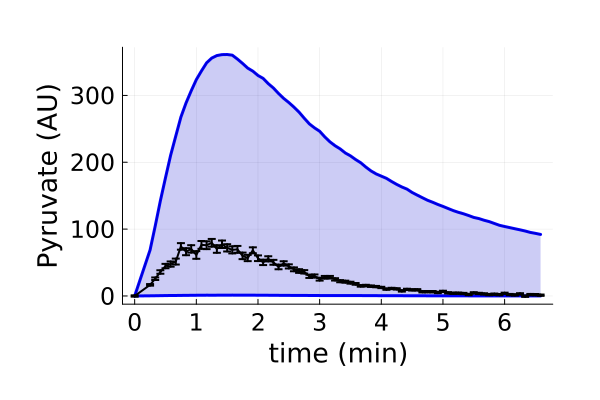

In [19]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"]./60, dat["Means"][:,1,2], yerror = dat["Erros"][:,1,2], linewidth = 2, colour = "black", label = "")

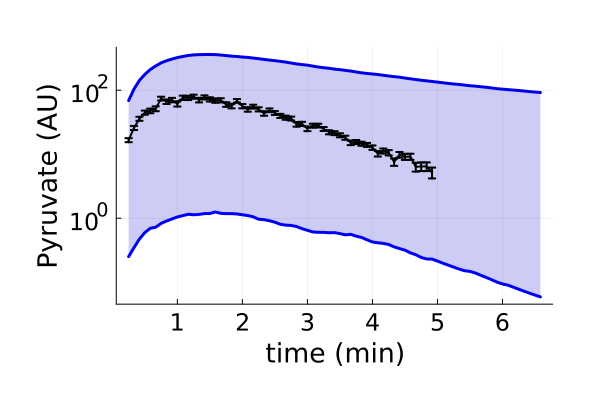

In [18]:
pr = plot(tsC2[2:end]./60, PriorQuant[1][2:end], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2[2:end]./60, PriorQuant[2][2:end], label = "", color = "blue", linewidth = 3)
  plot!(tsC2[2:end]./60, PriorQuant[1][2:end], fillrange=PriorQuant[2][2:end], label="", color="blue3", fillalpha=0.2, yaxis=:log)

  plot!(dat["sts"][2:end-20]./60, dat["Means"][:,1,2][2:end-20], yerror = dat["Erros"][:,1,2][2:end-20], linewidth = 2, colour = "black", label = "", yaxis=:log)

  
display(pr)

## MLE to obtain a good first guess for inference

In [20]:
function ObjectFunctMECp_MLE(p)

    # Define parameter vectors for each amount of cells (last parameter is a time delay, not used in here)
    pD2 = vcat(p[1:end-3], 0);

    # Define time vector
    t2cor = dat["sts"];

    # Define equaly-spaced time vector
    ts1 = collect(0:t2cor[end]);

    # Define initial value for simulation (use of experimental mean)
    ivss1 = [dat["Means"][1,1,1]/(ScFm*0.12), 0, dat["Means"][1,1,2]/(ScFm*0.12), p[end-2], p[end-1], p[end], 0, 0, 0, 0, 0, dat["Means"][1,1,1]/(ScFm*0.12), dat["Means"][1,1,2], dat["Means"][1,1,1]];

    # Convert sampling vector to integer to extract correct elements from simulation
    samps1 = convert.(Int, t2cor);

    # Simulate
    SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts1, pD2, ivss1, samps1);
    
    mm22 = sum((-1/2) .* (log(2*pi) .+ log.(dat["Erros"][:,1,2].^2) .+ ((SimOnTime1[:,13] .- dat["Means"][:,1,2]).^2)./(dat["Erros"][:,1,2].^2)));

    # obj = (mm21+mm22)*(mm11+mm12);
    if p[end-2] >= p[end-1]
        mm22 = mm22*10;
    end
    obj = -(mm22);

    
    return(obj)

end


function ObjectFunctMECp_Multi_MLE(p)

    # Define parameter vectors for each amount of cells (last parameter is a time delay, not used in here)
    pD2 = vcat(p[1:end-3], 0);
    obj = 0;
    
    for i in 1:length(dat["stsl"])
        # Define time vector
        t2cor = dat["sts"][:,i];

        # Define equaly-spaced time vector
        ts1 = collect(0:t2cor[end]);

        # Define initial value for simulation (use of experimental mean)
        ivss1 = [dat["Means"][1,i,1]/(ScFm*0.12), 0, dat["Means"][1,i,2]/(ScFm*0.12), p[end-2], p[end-1], p[end], 0, 0, 0, 0, 0, dat["Means"][1,i,1]/(ScFm*0.12), dat["Means"][1,i,2], dat["Means"][1,i,1]];

        # Convert sampling vector to integer to extract correct elements from simulation
        samps1 = convert.(Int, t2cor);

        # Simulate
        SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts1, pD2, ivss1, samps1);
    
        mm22 = sum((-1/2) .* (log(2*pi) .+ log.(dat["Erros"][:,i,2].^2) .+ ((SimOnTime1[:,13] .- dat["Means"][:,i,2]).^2)./(dat["Erros"][:,i,2].^2)));

        # obj = (mm21+mm22)*(mm11+mm12);
        if p[end-2] >= p[end-1]
            mm22 = mm22*10;
        end
        obj = -(mm22)+obj;
    end
    
    return(obj)

end


ObjectFunctMECp_Multi_MLE (generic function with 1 method)

In [21]:
global ScFm = 15;
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, 15, 50/(15*0.12), 5000/(15*0.12), 700/(15*0.12)];
ObjectFunctMECp_Multi_MLE(p)

3108.9839825599283

In [27]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [35]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMECp_Multi_MLE; SearchRange = vcat([(bounds[1][i], bounds[2][i]) for i in 1:13], [(boundY0[1][i], boundY0[2][i]) for i in 1:3]), # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*1, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.50 secs, 156 evals, 93 steps, improv/step: 0.419 (last = 0.4194), fitness=444.403537964
1.00 secs, 296 evals, 204 steps, improv/step: 0.368 (last = 0.3243), fitness=263.177170742
1.51 secs, 472 evals, 368 steps, improv/step: 0.378 (last = 0.3902), fitness=166.085932744
2.01 secs, 632 evals, 527 steps, improv/step: 0.326 (last = 0.2075), fitness=166.085932744
2.51 secs, 803 evals, 700 steps, improv/step: 0.293 (last = 0.1908), fitness=163.183560446
3.01 secs, 957 evals, 859 steps, improv/step: 0.262 (last = 0.1258), fitness=163.183560446
3.51 secs, 1128 evals, 1031 steps, improv/step: 0.241 (last = 0.1337), fitness=162.727487032
4.02 secs, 1291 evals, 1195 steps, improv/step: 0.223 (last = 0.1098), fitness=158.088932902
4.53 secs, 1443 evals, 1349 steps, improv/step: 0.214 (last = 0.1

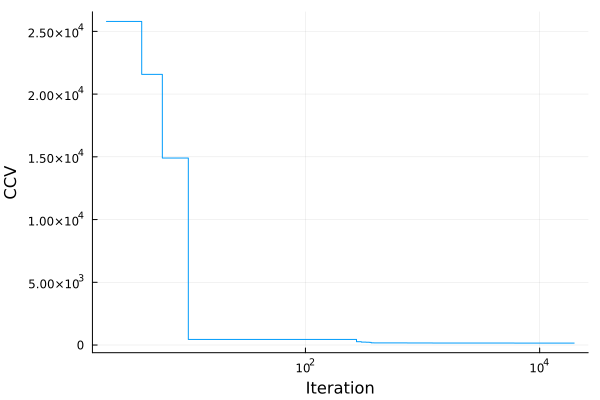

In [36]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
display(pl)

In [38]:
parfitT = zeros(16, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))
ppT = parfitT[:,bestPind]

16-element Vector{Float64}:
    48.0
    55.0
     0.007529546367546412
     0.01789412029355386
     0.042601896559436074
     0.4341440053739665
     1.1989355719008872
     0.8594109632737839
     0.8694983836096314
     0.011657884960827475
     1.1678668893617723
     0.0012513259566069945
    15.0
   303.8694640846999
 24996.05999292867
   353.44389779863167

In [40]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMTRRCmp_ScF_OED1.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_OED1.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [22]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_OED1.jld2")["resMMat"][:,1]


16-element Vector{Float64}:
    48.0
    55.0
     0.007529546367546412
     0.01789412029355386
     0.042601896559436074
     0.4341440053739665
     1.1989355719008872
     0.8594109632737839
     0.8694983836096314
     0.011657884960827475
     1.1678668893617723
     0.0012513259566069945
    15.0
   303.8694640846999
 24996.05999292867
   353.44389779863167

## Compute structure for Stan's initial guess

In [23]:
preTrans = zeros(13);

preTrans[1] = (ppT[3]-0.0055)/0.00275; 
preTrans[2] = (ppT[4]-0.0275)/0.01375;          
preTrans[3] = (ppT[5]-0.045)/0.0225;
preTrans[4] = (ppT[6]-0.45)/0.225;
preTrans[5] = (ppT[7]-0.95)/0.475;
preTrans[6] = (ppT[8]-0.95)/0.475;
preTrans[7] = (ppT[9]-0.95)/0.475;
preTrans[8] = (ppT[10]-0.0085)/0.00425;
preTrans[9] = (ppT[11]-0.95)/0.475;
preTrans[10] = (ppT[12]-0.0029)/0.00145;


preTrans[11] = (ppT[14]-650)/260;
preTrans[12] = (ppT[15]-16000)/6400;
preTrans[13] = (ppT[16]-550)/275;

In [24]:

samps = hcat(preTrans,preTrans,preTrans,preTrans);
names = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

ini = genStanInitDict(samps, names, 4)

4-element Vector{Dict{String, Any}}:
 Dict("kbnE" => 0.7430317554888175, "LDH" => -0.7147494625504303, "kin" => 0.7380168609259683, "ki" => 0.4586671354984681, "kunE" => -0.16947708713761805, "kpl" => -0.6986094331960828, "NADH" => -1.3312712919819234, "kup" => -0.190713761528876, "kbp" => 0.5240748882123941, "kr" => -1.1370165816503486…)
 Dict("kbnE" => 0.7430317554888175, "LDH" => -0.7147494625504303, "kin" => 0.7380168609259683, "ki" => 0.4586671354984681, "kunE" => -0.16947708713761805, "kpl" => -0.6986094331960828, "NADH" => -1.3312712919819234, "kup" => -0.190713761528876, "kbp" => 0.5240748882123941, "kr" => -1.1370165816503486…)
 Dict("kbnE" => 0.7430317554888175, "LDH" => -0.7147494625504303, "kin" => 0.7380168609259683, "ki" => 0.4586671354984681, "kunE" => -0.16947708713761805, "kpl" => -0.6986094331960828, "NADH" => -1.3312712919819234, "kup" => -0.190713761528876, "kbp" => 0.5240748882123941, "kr" => -1.1370165816503486…)
 Dict("kbnE" => 0.7430317554888175, "LDH" => -0.714

In [31]:
ini[1]

Dict{String, Any} with 13 entries:
  "kbnE" => 0.743032
  "LDH"  => -0.714749
  "kin"  => 0.738017
  "ki"   => 0.458667
  "kunE" => -0.169477
  "kpl"  => -0.698609
  "NADH" => -1.33127
  "kup"  => -0.190714
  "kbp"  => 0.524075
  "kr"   => -1.13702
  "NAD"  => 1.40563
  "kun"  => -0.0704711
  "kbn"  => -0.106582

## Inference

In [32]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\HP_PyrLac_CompetitiveRepressionModel_FixedT1ScF.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrCompRepr_OED1_Try1", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 0.1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [33]:
rc, chns, cnames = stan(StanModel, dat, init = ini) 


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessingInference/ComputationalBayesianOED/tmp/PyrCompRepr_OED1_Try1.stan', line 198, column 6 to column 133)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessin

Inference for Stan model: PyrCompRepr_OED1_Try1_model
4 chains: each with iter=(2000,2000,2000,2000); warmup=(1000,1000,1000,1000); thin=(1,1,1,1); 12000 iterations saved.

Warmup took (85234, 87032, 88526, 91013) seconds, 98 hours total
Sampling took (222409, 198073, 146862, 202776) seconds, 214 hours total

                    Mean     MCSE   StdDev        5%       50%       95%    N_Eff  N_Eff/s    R_hat

lp__            -1.6e+02  6.0e-02  2.4e+00  -1.7e+02  -1.6e+02  -1.6e+02  1.6e+03  2.1e-03  1.0e+00
accept_stat__    9.1e-01  3.9e-02  1.9e-01   4.9e-01   9.8e-01      1.00       23  3.0e-05      1.1
stepsize__       5.8e-03  1.1e-03  2.3e-03   2.8e-03   5.5e-03     0.011      4.1  5.3e-06      1.4
treedepth__      9.0e+00  3.7e-01  1.3e+00   7.0e+00   9.0e+00        10       13  1.7e-05      1.1
n_leapfrog__     7.1e+02  1.0e+02  3.1e+02   2.3e+02   5.1e+02      1023      9.5  1.2e-05      1.1
divergent__      5.0e-02  5.8e-03  2.2e-01   0.0e+00   0.0e+00       1.0     1426  1.9e-

(0, [-158.008 0.200478 … 25076.8 355.876; -158.008 0.0 … 25076.8 355.876; … ; -160.506 0.979124 … 18703.9 288.758; -158.524 0.980103 … 15109.0 240.883;;; -159.474 0.875255 … 17012.1 226.634; -159.474 0.0 … 17012.1 226.634; … ; -158.384 0.877042 … 15679.7 420.695; -161.151 0.96504 … 20326.5 289.702;;; -159.991 0.775697 … 25482.4 280.982; -159.991 0.0 … 25482.4 280.982; … ; -167.067 0.986314 … 9844.27 433.918; -162.071 0.889014 … 20650.0 305.202;;; -161.959 0.999364 … 28332.3 433.004; -161.959 0.0 … 28332.3 433.004; … ; -160.748 0.994424 … 17342.3 99.855; -163.12 0.986982 … 28233.1 119.315], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "kin", "kpl", "kbn"  …  "theta.7", "theta.8", "theta.9", "theta.10", "theta.11", "theta.12", "theta.13", "inits.1", "inits.2", "inits.3"])

In [37]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PyrCompetitiveRepressionInferRes_OED1_Try1.jld", "rc", rc, "chns", chns, "cnames", cnames)

In [38]:
poster = vcat(chns[1001:end, end-15:end, 1], chns[1001:end, end-15:end, 2], chns[1001:end, end-15:end, 3], chns[1001:end, end-15:end, 4])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED1_Try1.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED1_Try1.csv", DataFrame(poster, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED1_Try1.csv"

In [25]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED1_Try1.csv", DataFrame))

8000×16 Matrix{Float64}:
 48.0  55.0  0.00711144  0.0168172  …  15.0   460.029  10398.4   276.128
 48.0  55.0  0.00856487  0.0187513     15.0   254.578  21163.6   490.129
 48.0  55.0  0.00710815  0.0191295     15.0   255.332  14132.0   370.987
 48.0  55.0  0.00813633  0.0171945     15.0   246.752   7172.92  347.876
 48.0  55.0  0.00748024  0.0184364     15.0   338.086  18868.2   353.715
 48.0  55.0  0.00537024  0.0197274  …  15.0   602.015  17990.0   230.442
 48.0  55.0  0.00486365  0.0195106     15.0   533.546  12511.3   154.976
 48.0  55.0  0.00747033  0.01826       15.0   249.478  15634.7   313.346
 48.0  55.0  0.00488766  0.0196247     15.0   478.686  20195.6   128.323
 48.0  55.0  0.00678761  0.018026      15.0   568.16   20421.3   255.691
  ⋮                                 ⋱                              ⋮
 48.0  55.0  0.00715667  0.0192235     15.0   436.904  30017.0   313.449
 48.0  55.0  0.00419595  0.0205502     15.0  1208.39    6952.96   94.8841
 48.0  55.0  0.00436444  0.02

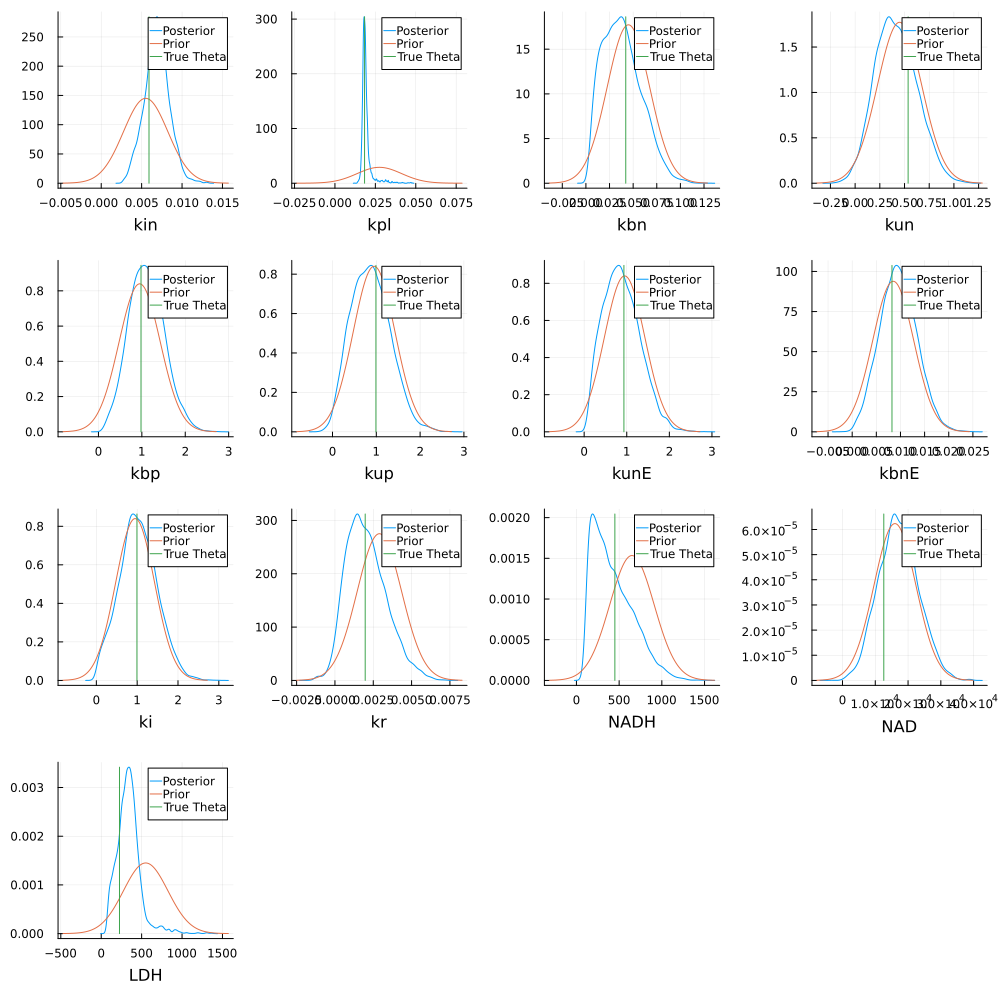

In [33]:
pp1 = plot(kde(poster[:,3]), label = "Posterior", xlabel = names[1])
plot!(Normal(0.0055, 0.00275), label = "Prior")
plot!([trueP[3], trueP[3]],[0, maximum(kde(poster[:,3]).density)], label = "True Theta")

pp2 = plot(kde(poster[:,4]), label = "Posterior", xlabel = names[2])
plot!(Normal(0.0275, 0.01375), label = "Prior")
plot!([trueP[4], trueP[4]],[0, maximum(kde(poster[:,4]).density)], label = "True Theta")

pp3 = plot(kde(poster[:,5]), label = "Posterior", xlabel = names[3])
plot!(Normal(0.045, 0.0225), label = "Prior")
plot!([trueP[5], trueP[5]],[0, maximum(kde(poster[:,5]).density)], label = "True Theta")

pp4 = plot(kde(poster[:,6]), label = "Posterior", xlabel = names[4])
plot!(Normal(0.45, 0.225), label = "Prior")
plot!([trueP[6], trueP[6]],[0, maximum(kde(poster[:,6]).density)], label = "True Theta")

pp5 = plot(kde(poster[:,7]), label = "Posterior", xlabel = names[5])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[7], trueP[7]],[0, maximum(kde(poster[:,7]).density)], label = "True Theta")

pp6 = plot(kde(poster[:,8]), label = "Posterior", xlabel = names[6])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[8], trueP[8]],[0, maximum(kde(poster[:,8]).density)], label = "True Theta")

pp7 = plot(kde(poster[:,9]), label = "Posterior", xlabel = names[7])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[9], trueP[9]],[0, maximum(kde(poster[:,9]).density)], label = "True Theta")

pp8 = plot(kde(poster[:,10]), label = "Posterior", xlabel = names[8])
plot!(Normal(0.0085, 0.00425), label = "Prior")
plot!([trueP[10], trueP[10]],[0, maximum(kde(poster[:,10]).density)], label = "True Theta")

pp9 = plot(kde(poster[:,11]), label = "Posterior", xlabel = names[9])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[11], trueP[11]],[0, maximum(kde(poster[:,11]).density)], label = "True Theta")

pp10 = plot(kde(poster[:,12]), label = "Posterior", xlabel = names[10])
plot!(Normal(0.0029, 0.00145), label = "Prior")
plot!([trueP[12], trueP[12]],[0, maximum(kde(poster[:,12]).density)], label = "True Theta")


pp11 = plot(kde(poster[:,14]), label = "Posterior", xlabel = names[11])
plot!(Normal(650, 260), label = "Prior")
plot!([InitsY0[1], InitsY0[1]],[0, maximum(kde(poster[:,14]).density)], label = "True Theta")

pp12 = plot(kde(poster[:,15]), label = "Posterior", xlabel = names[12])
plot!(Normal(16000, 6400), label = "Prior")
plot!([InitsY0[2], InitsY0[2]],[0, maximum(kde(poster[:,15]).density)], label = "True Theta")

pp13 = plot(kde(poster[:,16]), label = "Posterior", xlabel = names[13])
plot!(Normal(550, 275), label = "Prior")
plot!([InitsY0[3], InitsY0[3]],[0, maximum(kde(poster[:,16]).density)], label = "True Theta")

plot(pp1,pp2,pp3,pp4,pp5,pp6,pp7,pp8,pp9,pp10,pp11,pp12,pp13, size=(1000,1000))

In [34]:
-log(det(cov(hcat(poster[:,3:12], poster[:,14:end]))))

31.029357317683974

## Simulate Experiment Current Posterior

In [26]:
simsPoster = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,1,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,1,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,1,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPoster[i] = SimulsAll;
end

In [27]:
# Dims = Up/Down, Observable, Experiment
PostQuant = Array{Any}(undef,2,1,1);
lacPostSims = zeros(size(simsPoster[1])[1], 8000)
[lacPostSims[:,i] = simsPoster[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PostQuant[1,k,m] = [percentile(lacPostSims[j,:], 99.5) for j in 1:size(lacPostSims)[1]]; # Up
        PostQuant[2,k,m] = [percentile(lacPostSims[j,:], 0.5 ) for j in 1:size(lacPostSims)[1]]; # Down
    end
end


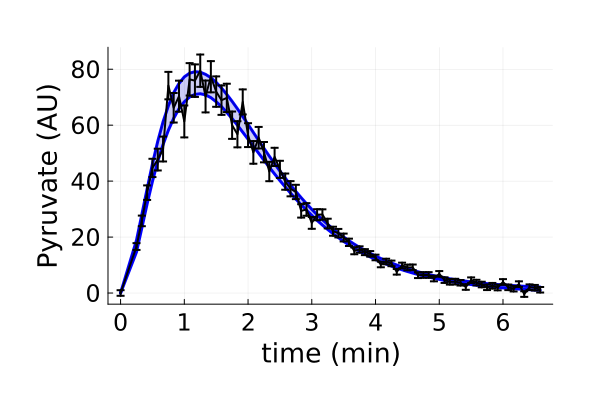

In [28]:
pr = plot(tsC2./60, PostQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PostQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PostQuant[1], fillrange=PostQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"]./60, dat["Means"][:,1,2], yerror = dat["Erros"][:,1,2], linewidth = 2, colour = "black", label = "")

# Perform OEDmc 2

In [29]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
global tsC2 = dat32mM[:,1]
global ts = 0:tsC2[end];
global samps = convert.(Int, tsC2);


In [30]:
global sampsTh = abs.(poster[:,1:13]);
global sampsY0 = abs.(poster[:,14:end]);

In [31]:
CompRepUtil_Entro_OEDmc([0.1])

190.5506104059466

## Optimisation 

In [61]:
steps = 1;

In [62]:
model = ElasticGPE(steps,                            # 4*2 input dimensions
           mean = MeanConst(0.),
           kernel = SEArd(zeros(steps), 3.),
           logNoise = 0.,
           capacity = 3000);

In [63]:
modeloptimizer = MAPGPOptimizer(every = 50, noisebounds = [-4, 3],       # bounds of the logNoise
                               kernbounds = [[-1*ones(steps); 0], [4*ones(steps); 10]],  # bounds of the 3 parameters GaussianProcesses.get_param_names(model.kernel)
                               maxeval = 50);

In [64]:
opt = BOpt(CompRepUtil_Entro_OEDmc,
          model,
          ExpectedImprovement(),                   # type of acquisition            UpperConfidenceBound
          modeloptimizer,
          [0.1],[40.], # lowerbounds, upperbounds
          repetitions = 1,                          # evaluate the function for each input 1 times
          maxiterations = 500,                      # evaluate at 50 input positions
          sense = Max,  
                                      # maximise the function
          acquisitionoptions = (method = :LD_LBFGS, # run optimization of acquisition function with NLopts :LD_LBFGS method
                restarts = 2,       # run the NLopt method from 5 random initial conditions each time.
                maxtime = 0.1,      # run the NLopt method for at most 0.1 second each time
                maxeval = 1000),    # run the NLopt methods for at most 1000 iterations (for other options see https://github.com/JuliaOpt/NLopt.jl
          verbosity = Progress);

In [65]:
result = boptimize!(opt) # 40 min

┌ Info: 2024-08-20T13:41:06.303	iteration: 5	current optimum: 199.0884137395081
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-08-20T13:41:13.863	iteration: 6	current optimum: 199.0884137395081
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-08-20T13:41:15.681	iteration: 7	current optimum: 199.0884137395081
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-08-20T13:41:19.268	iteration: 8	current optimum: 199.0884137395081
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-08-20T13:41:22.766	iteration: 9	current optimum: 199.1107644447729
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-08-20T1

(observed_optimum = 277.708324069332, observed_optimizer = [0.5186652269242372], model_optimum = 199.33976771033048, model_optimizer = [4.6072007859307265])

In [66]:
inputOED = result.observed_optimizer

1-element Vector{Float64}:
 0.5186652269242372

In [32]:
inputOED = 0.5186652269242372;

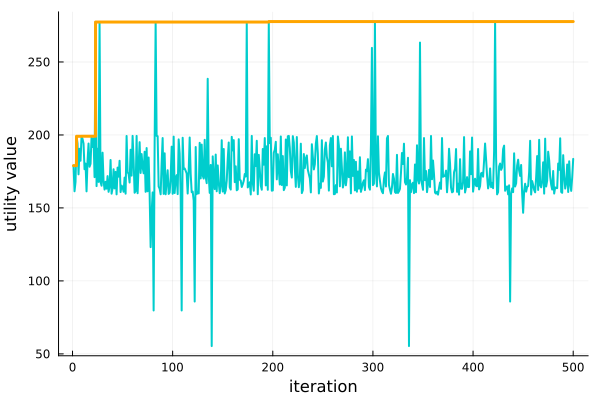

In [67]:
utilb = zeros(length(opt.model.y));
utilb[1] = opt.model.y[1];
for i in 2:length(opt.model.y)
    if opt.model.y[i]>=utilb[i-1]
        utilb[i] = opt.model.y[i];
    else
        utilb[i] = utilb[i-1];
    end
end

plot(opt.model.y, label = "", xlabel = "iteration", ylabel = "utility value", color="cyan3", linewidth = 2)
plot!(1:length(utilb), utilb, label = "", linetype=:step, color="orange", linewidth = 3)

### Save resutls

In [68]:
JLD2.save(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\OptimisationResults_Seq\\CR_SeqOED_OED2_OEDmc.jld"), "result", result, "inputOED",inputOED)

In [69]:
optres = Dict("acquisitionoptions"=>opt.acquisitionoptions,
                "duration"=>opt.duration,
#                 "func"=>opt.func,
#                 "initializer"=>opt.initializer,
#                 "iterations"=>opt.iterations,
#                 "iterations"=>opt.iterations,
#                 "lowerbounds"=>opt.lowerbounds,
#                 "model"=>opt.model,
                "model_optimizer"=>opt.model_optimizer,
                "model_optimum"=>opt.model_optimum,
                "modeloptimizer"=>opt.modeloptimizer,
                "observed_optimizer"=>opt.observed_optimizer,
                "observed_optimum"=>opt.observed_optimum,
#                 "opt"=>opt.opt,
                "repetitions"=>opt.repetitions,
                "sense"=>opt.sense,
#                 "timeroutput"=>opt.timeroutput,
                "upperbounds"=>opt.upperbounds,
#                 "verbosity"=>opt.verbosity,
                "modelX"=>Array(opt.model.x),
                "modelY"=>Array(opt.model.y));
JLD2.save(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\OptimisationResults_Seq\\CR_SeqOED_OED2_OEDmc2.jld"), optres)

## Generate Pseudo-Data

In [33]:
Nexp = 1;

ivss = [round(inputOED[1], digits = 1)*1000, 0, 0, InitsY0[1], InitsY0[2], InitsY0[3], 0, 0, 0, 0, 0, round(inputOED[1], digits = 1)*1000, 0, round(inputOED[1], digits = 1)*1000*(trueP[end]*0.12)]

SimulsAll = Array{Any}(undef, Nexp,3);
for i in 1:Nexp
    SimulsAll[i,1], SimulsAll[i,2], SimulsAll[i,3]  = PyruvateHP_NMR_SolveAllCp(ts, vcat(trueP, 0), ivss, samps);
end
ObsS = Array{Any}(undef, Nexp,2);
for i in 1:Nexp
    ObsS[i,1] = SimulsAll[i,1][:,14,1]; # Pyruvate HP
    ObsS[i,2] = SimulsAll[i,1][:,13,1]; # Lactate HP
end

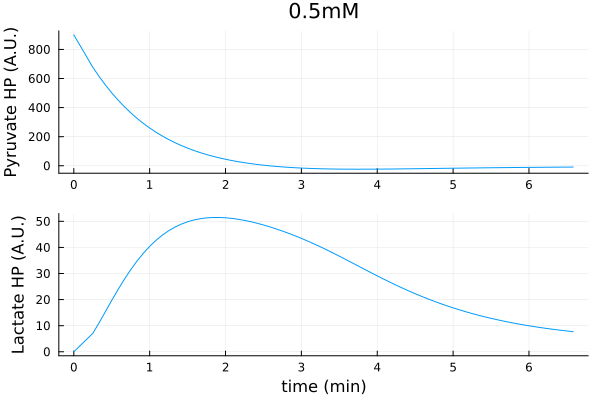

In [34]:
pp1 = plot(samps./60, ObsS[1,1], label = "", title = string(round(inputOED[1], digits = 1))*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, ObsS[1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

In [35]:
sigm1=0.12; # 10% additive heteroscedastic noise
sigm2=0.075;


Random.seed!(45456787); 

SolN1NoiseHet = zeros(length(samps),Nexp,2);
basemat = zeros(length(samps),Nexp,2);

i = 1

for i in 1:Nexp
    basemat[:,i,1] = ObsS[i,1]'.*sigm1; # introduce new diagonal matrices
    basemat[:,i,2] = ObsS[i,2]'.*sigm2;

    for zer in collect(1:length(samps)) # To avoid having standard deviations of 0
        if basemat[zer,i,1]<=1
            basemat[zer,i,1] = 1;
        end
        if basemat[zer,i,2]<=1
            basemat[zer,i,2] = 1;
        end
    end

    SolN1NoiseHet[:,i, 1] = ObsS[i,1]#+rand(MvNormal(zeros(length(samps)),basemat[:,i,1]));
    SolN1NoiseHet[:,i, 2] = ObsS[i,2]+rand(MvNormal(zeros(length(samps)),basemat[:,i,2]));
    SolN1NoiseHet[1,i, 2] = 0;
end

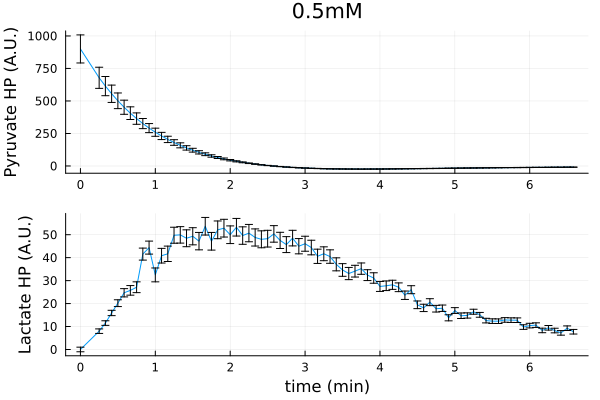

In [36]:
pp1 = plot(samps./60, SolN1NoiseHet[:,1, 1], yerror = basemat[:,1,1], label = "", title = string(round(inputOED[1], digits = 1))*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, SolN1NoiseHet[:,1, 2], yerror = basemat[:,1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

## Generate CSV Files For PseudoData

In [76]:
# Observables
for i in 1:Nexp
    Observables = zeros(length(samps),5);
    Observables[:,1] = samps;
    Observables[:,2] = SolN1NoiseHet[:,i, 1];
    Observables[:,3] = basemat[:,i, 1];
    Observables[:,4] = SolN1NoiseHet[:,i, 2];
    Observables[:,5] = basemat[:,i, 2];
    obs_head = ["time","Pyr_MEAN","Pyr_STD","Lac_MEAN","Lac_STD"];

    df1 = DataFrame(Observables, :auto);
    rename!(df1, [obs_head[i] for i in 1:5]);
    CSV.write(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\CompRepr_OED2_Observables_Pyr",string(round(inputOED[1], digits = 1)),"mM.csv"), df1);
end

# Bayesian Inference 2

## Extract Data

In [37]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\";
i = 1;
paths = [mainpath*"CompRepr_OED1_Observables_Pyr"*string(round(1.2, digits = 1))*"mM.csv",
         mainpath*"CompRepr_OED2_Observables_Pyr"*string(round(inputOED[1], digits = 1))*"mM.csv"]

2-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 74 bytes ⋯ "r_OED1_Observables_Pyr1.2mM.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 74 bytes ⋯ "r_OED2_Observables_Pyr0.5mM.csv"

In [38]:
Random.seed!(8987654);
global dat = restructDatInfCompRep_FixedSF(paths, rand(Uniform(boundY0[1][1],boundY0[2][1])), rand(Uniform(boundY0[1][2],boundY0[2][2])), rand(Uniform(boundY0[1][3],boundY0[2][3])), 15)

Dict{String, Any} with 14 entries:
  "Means"  => [2160.0 900.0; 1627.91 678.033; … ; -0.720963 -9.2244; -0.749665 …
  "stsl"   => [78 78]
  "obSta"  => [1 2]
  "sts"    => [0 0; 15 15; … ; 390 390; 395 395]
  "obser"  => 2
  "Y0us"   => [1200.0 500.0; 0.0 0.0; … ; 0.0 0.0; 2160.0 900.0]
  "ts"     => [1.0e-20 1.0e-20; 1.0 1.0; … ; 394.0 394.0; 395.0 395.0]
  "itp"    => [0.0, 0.0]
  "ncells" => [0 0]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [259.2 108.0; 195.35 81.364; … ; 1.0 1.0; 1.0 1.0;;; 1.0 1.0; 1.2…
  "m"      => 2
  "nts"    => [395 395]

## Prior Prediction

In [39]:
simsPrior = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [round(inputOED[1], digits = 1)*1000, 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, round(inputOED[1], digits = 1)*1000, 0, round(inputOED[1], digits = 1)*1000*(sampsTh[i,end]*0.12)];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(abs.(poster[i,1:13]), 0), ivss, samps);

    simsPrior[i] = SimulsAll;
end

In [40]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,1,1);
lacPirorSims = zeros(size(simsPrior[1])[1], 8000)
[lacPirorSims[:,i] = simsPrior[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PriorQuant[1,k,m] = [percentile(lacPirorSims[j,:], 99.5) for j in 1:size(lacPirorSims)[1]]; # Up
        PriorQuant[2,k,m] = [percentile(lacPirorSims[j,:], 0.5 ) for j in 1:size(lacPirorSims)[1]]; # Down
    end
end


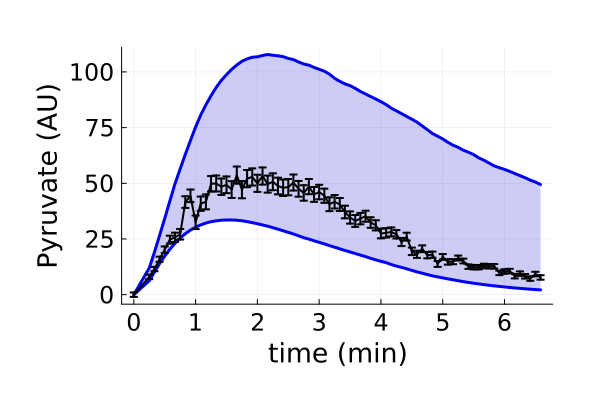

In [41]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")

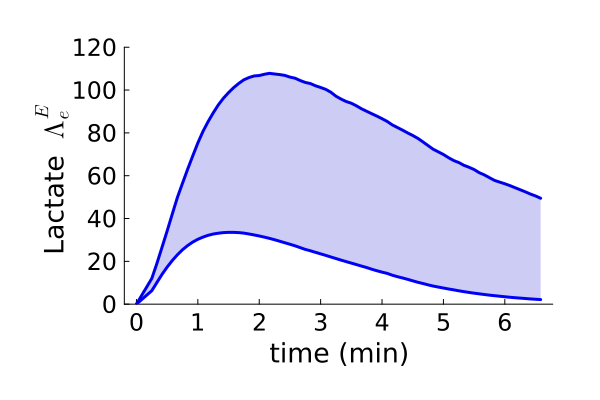

In [52]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Lactate  "*L"\Lambda^E_e", grid = false, ylim = (0,120))
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

savefig("OEDPredIter2.svg")

pr

## MLE to obtain a good first guess for inference

In [58]:
global ScFm = 15;
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, 15, 50/(15*0.12), 5000/(15*0.12), 700/(15*0.12)];
ObjectFunctMECp_Multi_MLE(p)

7614.3475732827055

In [59]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [60]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMECp_Multi_MLE; SearchRange = vcat([(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 1:13], 
                                                                [(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 14:16]), # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*2, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.51 secs, 77 evals, 43 steps, improv/step: 0.395 (last = 0.3953), fitness=918.421591936
1.01 secs, 153 evals, 94 steps, improv/step: 0.489 (last = 0.5686), fitness=840.295157988
1.51 secs, 243 evals, 163 steps, improv/step: 0.442 (last = 0.3768), fitness=368.400577656
2.01 secs, 333 evals, 237 steps, improv/step: 0.418 (last = 0.3649), fitness=368.400577656
2.51 secs, 425 evals, 324 steps, improv/step: 0.352 (last = 0.1724), fitness=368.400577656
3.02 secs, 519 evals, 417 steps, improv/step: 0.319 (last = 0.2043), fitness=368.400577656
3.55 secs, 601 evals, 504 steps, improv/step: 0.292 (last = 0.1609), fitness=368.400577656
4.06 secs, 682 evals, 587 steps, improv/step: 0.276 (last = 0.1807), fitness=368.400577656
4.56 secs, 764 evals, 670 steps, improv/step: 0.266 (last = 0.1928), fi

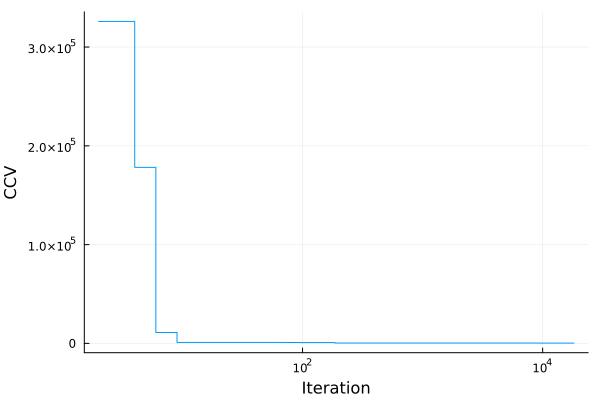

In [65]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
display(pl)

In [62]:
parfitT = zeros(16, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))
ppT = parfitT[:,bestPind]

16-element Vector{Float64}:
    48.0
    55.0
     0.006075698906225572
     0.017853466508429717
     0.07065818906710172
     0.34476650155800487
     1.5200242444071717
     1.6873302383582627
     0.4015349773763592
     0.006913608412701338
     2.7210227514355134
     0.002584871577472608
    15.0
   495.2605098606923
 13268.25760368461
   225.56411387728076

In [66]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMTRRCmp_ScF_OED2.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_OED2.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [53]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_OED2.jld2")["resMMat"][:,1]


16-element Vector{Float64}:
    48.0
    55.0
     0.006075698906225572
     0.017853466508429717
     0.07065818906710172
     0.34476650155800487
     1.5200242444071717
     1.6873302383582627
     0.4015349773763592
     0.006913608412701338
     2.7210227514355134
     0.002584871577472608
    15.0
   495.2605098606923
 13268.25760368461
   225.56411387728076

## Compute structure for Stan's initial guess

In [68]:
preTrans = zeros(13);

preTrans[1] = (ppT[3]-0.0055)/0.00275; 
preTrans[2] = (ppT[4]-0.0275)/0.01375;          
preTrans[3] = (ppT[5]-0.045)/0.0225;
preTrans[4] = (ppT[6]-0.45)/0.225;
preTrans[5] = (ppT[7]-0.95)/0.475;
preTrans[6] = (ppT[8]-0.95)/0.475;
preTrans[7] = (ppT[9]-0.95)/0.475;
preTrans[8] = (ppT[10]-0.0085)/0.00425;
preTrans[9] = (ppT[11]-0.95)/0.475;
preTrans[10] = (ppT[12]-0.0029)/0.00145;


preTrans[11] = (ppT[14]-650)/260;
preTrans[12] = (ppT[15]-16000)/6400;
preTrans[13] = (ppT[16]-550)/275;

In [69]:

samps = hcat(preTrans,preTrans,preTrans,preTrans);
names = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

ini = genStanInitDict(samps, names, 4)

4-element Vector{Dict{String, Any}}:
 Dict("kbnE" => -0.3732686087761558, "LDH" => -1.17976685862807, "kin" => 0.20934505680929905, "ki" => 3.728468950390555, "kunE" => -1.1546632055234543, "kpl" => -0.7015660721142024, "NADH" => -0.5951518851511834, "kup" => 1.5522741860173952, "kbp" => 1.2000510408572036, "kr" => -0.2173299465706152…)
 Dict("kbnE" => -0.3732686087761558, "LDH" => -1.17976685862807, "kin" => 0.20934505680929905, "ki" => 3.728468950390555, "kunE" => -1.1546632055234543, "kpl" => -0.7015660721142024, "NADH" => -0.5951518851511834, "kup" => 1.5522741860173952, "kbp" => 1.2000510408572036, "kr" => -0.2173299465706152…)
 Dict("kbnE" => -0.3732686087761558, "LDH" => -1.17976685862807, "kin" => 0.20934505680929905, "ki" => 3.728468950390555, "kunE" => -1.1546632055234543, "kpl" => -0.7015660721142024, "NADH" => -0.5951518851511834, "kup" => 1.5522741860173952, "kbp" => 1.2000510408572036, "kr" => -0.2173299465706152…)
 Dict("kbnE" => -0.3732686087761558, "LDH" => -1.17976685

In [70]:
ini[1]

Dict{String, Any} with 13 entries:
  "kbnE" => -0.373269
  "LDH"  => -1.17977
  "kin"  => 0.209345
  "ki"   => 3.72847
  "kunE" => -1.15466
  "kpl"  => -0.701566
  "NADH" => -0.595152
  "kup"  => 1.55227
  "kbp"  => 1.20005
  "kr"   => -0.21733
  "NAD"  => -0.426835
  "kun"  => -0.467704
  "kbn"  => 1.14036

## Inference

In [75]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\HP_PyrLac_CompetitiveRepressionModel_FixedT1ScF.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrCompRepr_OED2_Try1", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 0.1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [76]:
rc, chns, cnames = stan(StanModel, dat, init = ini) # 9320m 55s


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -4: 
Convergence test failures occurred too many times during one internal time step or minimum step size was reached. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessingInference/ComputationalBayesianOED/tmp/PyrCompRepr_OED2_Try1.stan', line 198, column 6 to column 133)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c

Inference for Stan model: PyrCompRepr_OED2_Try1_model
4 chains: each with iter=(2000,2000,2000,2000); warmup=(1000,1000,1000,1000); thin=(1,1,1,1); 12000 iterations saved.

Warmup took (158741, 155679, 160467, 155015) seconds, 175 hours total
Sampling took (349522, 360759, 398753, 389530) seconds, 416 hours total

                    Mean     MCSE   StdDev        5%       50%       95%    N_Eff  N_Eff/s    R_hat

lp__            -3.3e+02  4.3e-02  2.4e+00  -3.3e+02  -3.3e+02  -3.2e+02  3.2e+03  2.1e-03  1.0e+00
accept_stat__    9.2e-01  2.9e-03  1.6e-01   6.3e-01   9.8e-01   1.0e+00     3224  2.2e-03      1.0
stepsize__       5.5e-03  3.2e-04  1.7e-03   3.0e-03   5.5e-03   8.4e-03       26  1.7e-05      1.0
treedepth__      9.2e+00  3.7e-02  1.2e+00   8.0e+00   9.0e+00   1.0e+01      998  6.7e-04      1.0
n_leapfrog__     7.7e+02  2.6e+01  2.9e+02   2.6e+02   1.0e+03   1.0e+03      129  8.6e-05      1.0
divergent__      3.3e-02  2.7e-03  1.8e-01   0.0e+00   0.0e+00   0.0e+00     4398  

(0, [-330.547 0.974452 … 18251.9 233.714; -330.547 0.0 … 18251.9 233.714; … ; -329.056 0.999057 … 18101.8 249.759; -331.341 0.824869 … 27685.3 243.29;;; -327.92 0.951429 … 13450.5 232.389; -327.92 0.0 … 13450.5 232.389; … ; -328.303 0.467102 … 23690.4 230.496; -327.934 0.971703 … 15375.5 236.459;;; -329.622 0.377099 … 10826.6 242.541; -329.622 0.0 … 10826.6 242.541; … ; -330.83 0.993967 … 22330.7 223.708; -326.253 0.983219 … 20566.6 239.481;;; -324.513 0.95666 … 11393.9 241.25; -324.513 0.0 … 11393.9 241.25; … ; -326.246 0.992422 … 19493.8 222.288; -328.857 0.997813 … 17994.0 196.958], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "kin", "kpl", "kbn"  …  "theta.7", "theta.8", "theta.9", "theta.10", "theta.11", "theta.12", "theta.13", "inits.1", "inits.2", "inits.3"])

In [77]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PyrCompetitiveRepressionInferRes_OED2_Try1.jld", "rc", rc, "chns", chns, "cnames", cnames)

In [78]:
poster = vcat(chns[1001:end, end-15:end, 1], chns[1001:end, end-15:end, 2], chns[1001:end, end-15:end, 3], chns[1001:end, end-15:end, 4])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED2_Try1.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED2_Try1.csv", DataFrame(poster, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED2_Try1.csv"

In [54]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED2_Try1.csv", DataFrame))

8000×16 Matrix{Float64}:
 48.0  55.0  0.00629658  0.0186899  …  15.0  466.201  10957.3  234.208
 48.0  55.0  0.00646257  0.0186315     15.0  485.555  11734.7  234.374
 48.0  55.0  0.0063579   0.0181907     15.0  857.392  16311.8  224.573
 48.0  55.0  0.00647549  0.0178472     15.0  613.467  19442.2  249.195
 48.0  55.0  0.00630685  0.0180371     15.0  331.811  17018.7  231.204
 48.0  55.0  0.00604065  0.019077   …  15.0  608.389  18017.2  222.698
 48.0  55.0  0.00624281  0.0191208     15.0  557.05   17523.7  220.052
 48.0  55.0  0.00614474  0.0175869     15.0  287.119  12130.0  227.231
 48.0  55.0  0.00617431  0.0181426     15.0  852.803  11993.7  240.818
 48.0  55.0  0.00655977  0.017068      15.0  488.037  13006.9  231.752
  ⋮                                 ⋱                            ⋮
 48.0  55.0  0.00629545  0.0173665     15.0  337.219  12871.7  238.372
 48.0  55.0  0.00631913  0.0183613     15.0  899.771  16486.9  224.865
 48.0  55.0  0.00663391  0.0175197     15.0  626.358  14

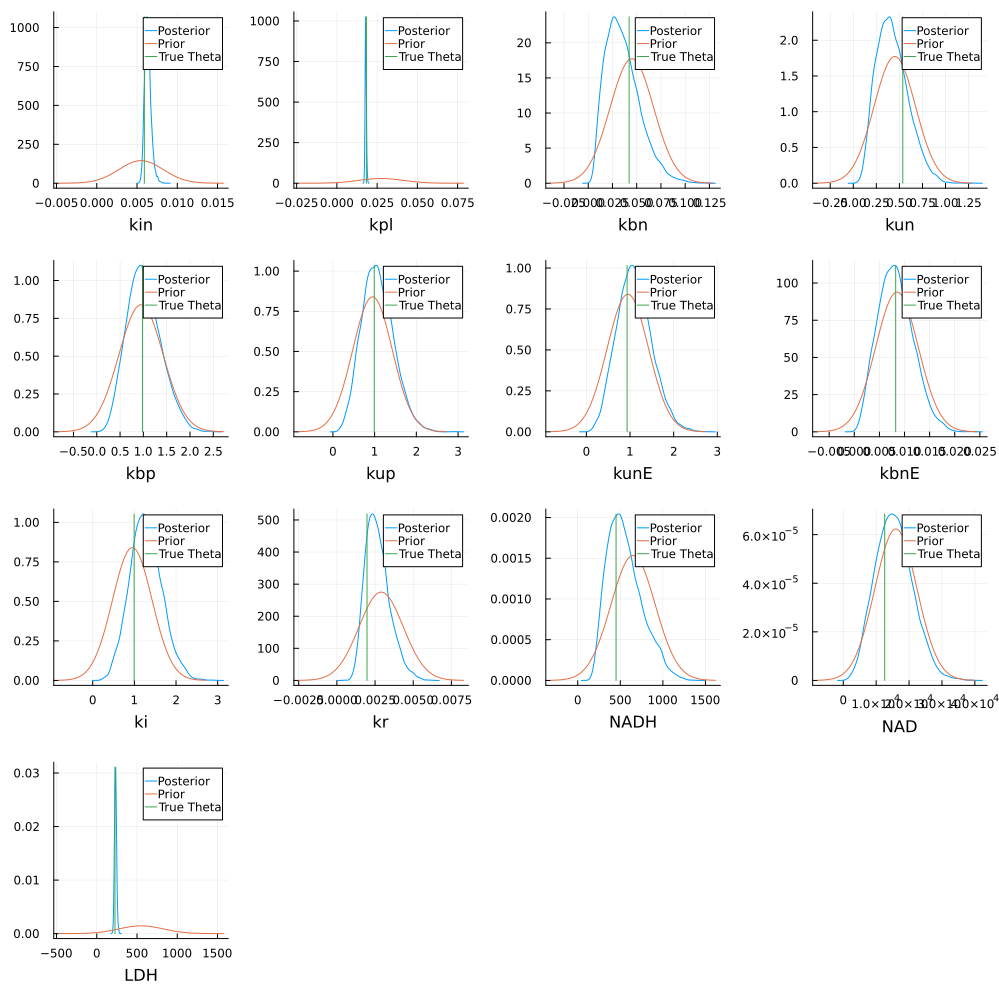

In [24]:
namess = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

pp1 = plot(kde(poster[:,3]), label = "Posterior", xlabel = namess[1])
plot!(Normal(0.0055, 0.00275), label = "Prior")
plot!([trueP[3], trueP[3]],[0, maximum(kde(poster[:,3]).density)], label = "True Theta")

pp2 = plot(kde(poster[:,4]), label = "Posterior", xlabel = namess[2])
plot!(Normal(0.0275, 0.01375), label = "Prior")
plot!([trueP[4], trueP[4]],[0, maximum(kde(poster[:,4]).density)], label = "True Theta")

pp3 = plot(kde(poster[:,5]), label = "Posterior", xlabel = namess[3])
plot!(Normal(0.045, 0.0225), label = "Prior")
plot!([trueP[5], trueP[5]],[0, maximum(kde(poster[:,5]).density)], label = "True Theta")

pp4 = plot(kde(poster[:,6]), label = "Posterior", xlabel = namess[4])
plot!(Normal(0.45, 0.225), label = "Prior")
plot!([trueP[6], trueP[6]],[0, maximum(kde(poster[:,6]).density)], label = "True Theta")

pp5 = plot(kde(poster[:,7]), label = "Posterior", xlabel = namess[5])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[7], trueP[7]],[0, maximum(kde(poster[:,7]).density)], label = "True Theta")

pp6 = plot(kde(poster[:,8]), label = "Posterior", xlabel = namess[6])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[8], trueP[8]],[0, maximum(kde(poster[:,8]).density)], label = "True Theta")

pp7 = plot(kde(poster[:,9]), label = "Posterior", xlabel = namess[7])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[9], trueP[9]],[0, maximum(kde(poster[:,9]).density)], label = "True Theta")

pp8 = plot(kde(poster[:,10]), label = "Posterior", xlabel = namess[8])
plot!(Normal(0.0085, 0.00425), label = "Prior")
plot!([trueP[10], trueP[10]],[0, maximum(kde(poster[:,10]).density)], label = "True Theta")

pp9 = plot(kde(poster[:,11]), label = "Posterior", xlabel = namess[9])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[11], trueP[11]],[0, maximum(kde(poster[:,11]).density)], label = "True Theta")

pp10 = plot(kde(poster[:,12]), label = "Posterior", xlabel = namess[10])
plot!(Normal(0.0029, 0.00145), label = "Prior")
plot!([trueP[12], trueP[12]],[0, maximum(kde(poster[:,12]).density)], label = "True Theta")


pp11 = plot(kde(poster[:,14]), label = "Posterior", xlabel = namess[11])
plot!(Normal(650, 260), label = "Prior")
plot!([InitsY0[1], InitsY0[1]],[0, maximum(kde(poster[:,14]).density)], label = "True Theta")

pp12 = plot(kde(poster[:,15]), label = "Posterior", xlabel = namess[12])
plot!(Normal(16000, 6400), label = "Prior")
plot!([InitsY0[2], InitsY0[2]],[0, maximum(kde(poster[:,15]).density)], label = "True Theta")

pp13 = plot(kde(poster[:,16]), label = "Posterior", xlabel = namess[13])
plot!(Normal(550, 275), label = "Prior")
plot!([InitsY0[3], InitsY0[3]],[0, maximum(kde(poster[:,16]).density)], label = "True Theta")

plot(pp1,pp2,pp3,pp4,pp5,pp6,pp7,pp8,pp9,pp10,pp11,pp12,pp13, size=(1000,1000))

In [25]:
-log(det(cov(hcat(poster[:,3:12], poster[:,14:end]))))

51.52318308964369

## Simulate Experiment Current Posterior

In [55]:
simsPoster = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,end,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPoster[i] = SimulsAll;
end

In [56]:
# Dims = Up/Down, Observable, Experiment
PostQuant = Array{Any}(undef,2,1,1);
lacPostSims = zeros(size(simsPoster[1])[1], 8000)
[lacPostSims[:,i] = simsPoster[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PostQuant[1,k,m] = [percentile(lacPostSims[j,:], 99.5) for j in 1:size(lacPostSims)[1]]; # Up
        PostQuant[2,k,m] = [percentile(lacPostSims[j,:], 0.5 ) for j in 1:size(lacPostSims)[1]]; # Down
    end
end


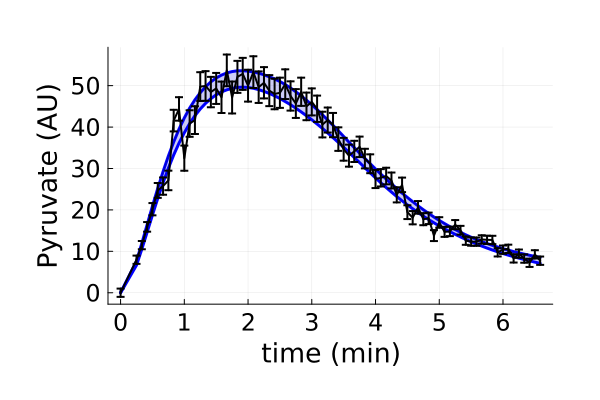

In [57]:
pr = plot(tsC2./60, PostQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PostQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PostQuant[1], fillrange=PostQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")

# Perform OEDmc 3

In [58]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
global tsC2 = dat32mM[:,1]
global ts = 0:tsC2[end];
global samps = convert.(Int, tsC2);


In [59]:
global sampsTh = abs.(poster[:,1:13]);
global sampsY0 = abs.(poster[:,14:end]);

In [31]:
CompRepUtil_Entro_OEDmc([0.1])

27.3730170484016

## Optimisation 

In [91]:
steps = 1;

In [92]:
model = ElasticGPE(steps,                            # 4*2 input dimensions
           mean = MeanConst(0.),
           kernel = SEArd(zeros(steps), 3.),
           logNoise = 0.,
           capacity = 3000);

In [93]:
modeloptimizer = MAPGPOptimizer(every = 50, noisebounds = [-4, 3],       # bounds of the logNoise
                               kernbounds = [[-1*ones(steps); 0], [4*ones(steps); 10]],  # bounds of the 3 parameters GaussianProcesses.get_param_names(model.kernel)
                               maxeval = 50);

In [94]:
opt = BOpt(CompRepUtil_Entro_OEDmc,
          model,
          ExpectedImprovement(),                   # type of acquisition            UpperConfidenceBound
          modeloptimizer,
          [0.1],[40.], # lowerbounds, upperbounds
          repetitions = 1,                          # evaluate the function for each input 1 times
          maxiterations = 500,                      # evaluate at 50 input positions
          sense = Max,  
                                      # maximise the function
          acquisitionoptions = (method = :LD_LBFGS, # run optimization of acquisition function with NLopts :LD_LBFGS method
                restarts = 2,       # run the NLopt method from 5 random initial conditions each time.
                maxtime = 0.1,      # run the NLopt method for at most 0.1 second each time
                maxeval = 1000),    # run the NLopt methods for at most 1000 iterations (for other options see https://github.com/JuliaOpt/NLopt.jl
          verbosity = Progress);

In [95]:
result = boptimize!(opt) # 40 min

┌ Info: 2024-08-27T15:47:09.972	iteration: 5	current optimum: 134.78245939294345
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-08-27T15:47:17.954	iteration: 6	current optimum: 134.78245939294345
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-08-27T15:47:23.367	iteration: 7	current optimum: 134.78245939294345
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-08-27T15:47:28.533	iteration: 8	current optimum: 134.78245939294345
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-08-27T15:47:33.493	iteration: 9	current optimum: 134.78245939294345
└ @ BayesianOptimization C:\Users\dgomez\.julia\packages\BayesianOptimization\nq1HY\src\BayesianOptimization.jl:140
┌ Info: 2024-08

(observed_optimum = 134.9427208005002, observed_optimizer = [8.26438847101465], model_optimum = 134.94490099833718, model_optimizer = [8.795018441815131])

In [100]:
inputOED = result.observed_optimizer

1-element Vector{Float64}:
 8.26438847101465

In [60]:
inputOED = 8.26438847101465;

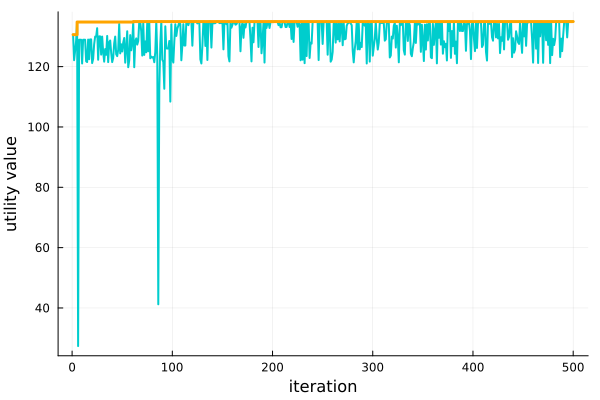

In [101]:
utilb = zeros(length(opt.model.y));
utilb[1] = opt.model.y[1];
for i in 2:length(opt.model.y)
    if opt.model.y[i]>=utilb[i-1]
        utilb[i] = opt.model.y[i];
    else
        utilb[i] = utilb[i-1];
    end
end

plot(opt.model.y, label = "", xlabel = "iteration", ylabel = "utility value", color="cyan3", linewidth = 2)
plot!(1:length(utilb), utilb, label = "", linetype=:step, color="orange", linewidth = 3)

### Save resutls

In [98]:
JLD2.save(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\OptimisationResults_Seq\\CR_SeqOED_OED3_OEDmc.jld"), "result", result, "inputOED",inputOED)

In [99]:
optres = Dict("acquisitionoptions"=>opt.acquisitionoptions,
                "duration"=>opt.duration,
#                 "func"=>opt.func,
#                 "initializer"=>opt.initializer,
#                 "iterations"=>opt.iterations,
#                 "iterations"=>opt.iterations,
#                 "lowerbounds"=>opt.lowerbounds,
#                 "model"=>opt.model,
                "model_optimizer"=>opt.model_optimizer,
                "model_optimum"=>opt.model_optimum,
                "modeloptimizer"=>opt.modeloptimizer,
                "observed_optimizer"=>opt.observed_optimizer,
                "observed_optimum"=>opt.observed_optimum,
#                 "opt"=>opt.opt,
                "repetitions"=>opt.repetitions,
                "sense"=>opt.sense,
#                 "timeroutput"=>opt.timeroutput,
                "upperbounds"=>opt.upperbounds,
#                 "verbosity"=>opt.verbosity,
                "modelX"=>Array(opt.model.x),
                "modelY"=>Array(opt.model.y));
JLD2.save(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\OptimisationResults_Seq\\CR_SeqOED_OED3_OEDmc2.jld"), optres)

## Generate Pseudo-Data

In [61]:
Nexp = 1;

ivss = [round(inputOED[1], digits = 1)*1000, 0, 0, InitsY0[1], InitsY0[2], InitsY0[3], 0, 0, 0, 0, 0, round(inputOED[1], digits = 1)*1000, 0, round(inputOED[1], digits = 1)*1000*(trueP[end]*0.12)]

SimulsAll = Array{Any}(undef, Nexp,3);
for i in 1:Nexp
    SimulsAll[i,1], SimulsAll[i,2], SimulsAll[i,3]  = PyruvateHP_NMR_SolveAllCp(ts, vcat(trueP, 0), ivss, samps);
end
ObsS = Array{Any}(undef, Nexp,2);
for i in 1:Nexp
    ObsS[i,1] = SimulsAll[i,1][:,14,1]; # Pyruvate HP
    ObsS[i,2] = SimulsAll[i,1][:,13,1]; # Lactate HP
end

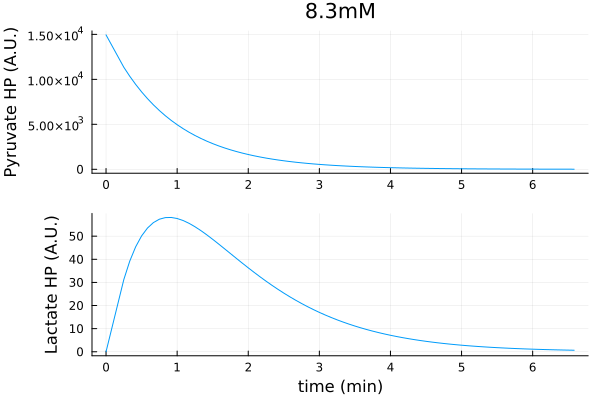

In [62]:
pp1 = plot(samps./60, ObsS[1,1], label = "", title = string(round(inputOED[1], digits = 1))*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, ObsS[1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

In [63]:
sigm1=0.12; # 10% additive heteroscedastic noise
sigm2=0.075;


Random.seed!(78965643); 

SolN1NoiseHet = zeros(length(samps),Nexp,2);
basemat = zeros(length(samps),Nexp,2);

i = 1

for i in 1:Nexp
    basemat[:,i,1] = ObsS[i,1]'.*sigm1; # introduce new diagonal matrices
    basemat[:,i,2] = ObsS[i,2]'.*sigm2;

    for zer in collect(1:length(samps)) # To avoid having standard deviations of 0
        if basemat[zer,i,1]<=1
            basemat[zer,i,1] = 1;
        end
        if basemat[zer,i,2]<=1
            basemat[zer,i,2] = 1;
        end
    end

    SolN1NoiseHet[:,i, 1] = ObsS[i,1]#+rand(MvNormal(zeros(length(samps)),basemat[:,i,1]));
    SolN1NoiseHet[:,i, 2] = ObsS[i,2]+rand(MvNormal(zeros(length(samps)),basemat[:,i,2]));
    SolN1NoiseHet[1,i, 2] = 0;
end

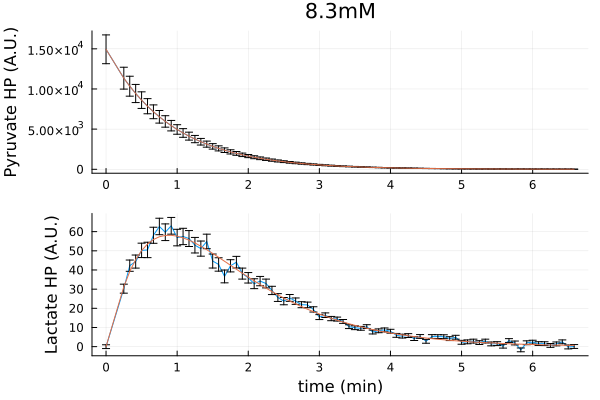

In [64]:
pp1 = plot(samps./60, SolN1NoiseHet[:,1, 1], yerror = basemat[:,1,1], label = "", title = string(round(inputOED[1], digits = 1))*"mM", ylabel = "Pyruvate HP (A.U.)")
plot!(samps./60, ObsS[1,1], label = "")

pp2 = plot(samps./60, SolN1NoiseHet[:,1, 2], yerror = basemat[:,1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")
plot!(samps./60, ObsS[1,2], label = "")

PP1 = plot(pp1,pp2, layout = (2,1))

## Generate CSV Files For PseudoData

In [107]:
# Observables
for i in 1:Nexp
    Observables = zeros(length(samps),5);
    Observables[:,1] = samps;
    Observables[:,2] = SolN1NoiseHet[:,i, 1];
    Observables[:,3] = basemat[:,i, 1];
    Observables[:,4] = SolN1NoiseHet[:,i, 2];
    Observables[:,5] = basemat[:,i, 2];
    obs_head = ["time","Pyr_MEAN","Pyr_STD","Lac_MEAN","Lac_STD"];

    df1 = DataFrame(Observables, :auto);
    rename!(df1, [obs_head[i] for i in 1:5]);
    CSV.write(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\CompRepr_OED3_Observables_Pyr",string(round(inputOED[1], digits = 1)),"mM.csv"), df1);
end

# Bayesian Inference 3

## Extract Data

In [65]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\";
i = 1;
paths = [mainpath*"CompRepr_OED1_Observables_Pyr"*string(round(1.2, digits = 1))*"mM.csv",
         mainpath*"CompRepr_OED2_Observables_Pyr"*string(round(0.5, digits = 1))*"mM.csv",
         mainpath*"CompRepr_OED3_Observables_Pyr"*string(round(inputOED[1], digits = 1))*"mM.csv"]

3-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 74 bytes ⋯ "r_OED1_Observables_Pyr1.2mM.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 74 bytes ⋯ "r_OED2_Observables_Pyr0.5mM.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 74 bytes ⋯ "r_OED3_Observables_Pyr8.3mM.csv"

In [66]:
Random.seed!(8987654);
global dat = restructDatInfCompRep_FixedSF(paths, rand(Uniform(boundY0[1][1],boundY0[2][1])), rand(Uniform(boundY0[1][2],boundY0[2][2])), rand(Uniform(boundY0[1][3],boundY0[2][3])), 15)

Dict{String, Any} with 14 entries:
  "Means"  => [2160.0 900.0 14940.0; 1627.91 678.033 11342.1; … ; -0.720963 -9.…
  "stsl"   => [78 78 78]
  "obSta"  => [1 2]
  "sts"    => [0 0 0; 15 15 15; … ; 390 390 390; 395 395 395]
  "obser"  => 2
  "Y0us"   => [1200.0 500.0 8300.0; 0.0 0.0 0.0; … ; 0.0 0.0 0.0; 2160.0 900.0 …
  "ts"     => [1.0e-20 1.0e-20 1.0e-20; 1.0 1.0 1.0; … ; 394.0 394.0 394.0; 395…
  "itp"    => [0.0, 0.0, 0.0]
  "ncells" => [0 0 0]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [259.2 108.0 1792.8; 195.35 81.364 1361.05; … ; 1.0 1.0 1.36027; …
  "m"      => 3
  "nts"    => [395 395 395]

## Prior Prediction

In [67]:
simsPrior = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [round(inputOED[1], digits = 1)*1000, 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, round(inputOED[1], digits = 1)*1000, 0, round(inputOED[1], digits = 1)*1000*(sampsTh[i,end]*0.12)];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(abs.(poster[i,1:13]), 0), ivss, samps);

    simsPrior[i] = SimulsAll;
end

In [68]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,1,1);
lacPirorSims = zeros(size(simsPrior[1])[1], 8000)
[lacPirorSims[:,i] = simsPrior[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PriorQuant[1,k,m] = [percentile(lacPirorSims[j,:], 99.5) for j in 1:size(lacPirorSims)[1]]; # Up
        PriorQuant[2,k,m] = [percentile(lacPirorSims[j,:], 0.5 ) for j in 1:size(lacPirorSims)[1]]; # Down
    end
end


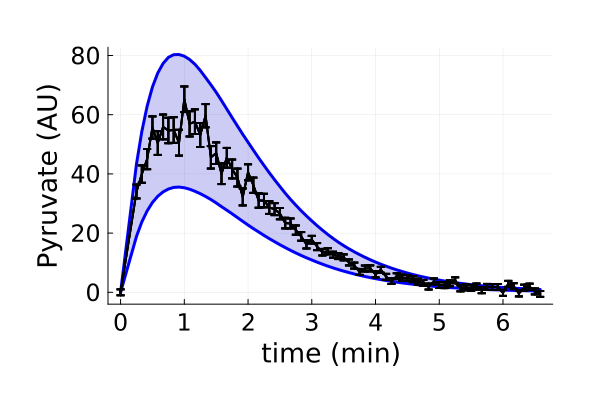

In [69]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")

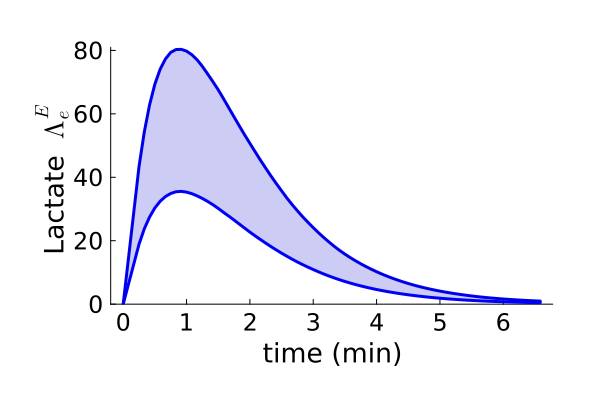

In [74]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Lactate  "*L"\Lambda^E_e", grid = false, ylim = (0,81))
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

savefig("OEDPredIter3.svg")

pr

## MLE to obtain a good first guess for inference

In [49]:
global ScFm = 15;
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, 15, 50/(15*0.12), 5000/(15*0.12), 700/(15*0.12)];
ObjectFunctMECp_Multi_MLE(p)

9736.317316956975

In [50]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [51]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMECp_Multi_MLE; SearchRange = vcat([(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 1:13], 
                                                                [(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 14:16]), # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*3, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.51 secs, 47 evals, 26 steps, improv/step: 0.577 (last = 0.5769), fitness=601.771468030
1.01 secs, 91 evals, 52 steps, improv/step: 0.558 (last = 0.5385), fitness=601.771468030
1.51 secs, 140 evals, 87 steps, improv/step: 0.506 (last = 0.4286), fitness=601.771468030
2.02 secs, 192 evals, 122 steps, improv/step: 0.434 (last = 0.2571), fitness=510.072791166
2.52 secs, 244 evals, 162 steps, improv/step: 0.407 (last = 0.3250), fitness=510.072791166
3.03 secs, 293 evals, 203 steps, improv/step: 0.399 (last = 0.3659), fitness=510.072791166
3.54 secs, 347 evals, 246 steps, improv/step: 0.374 (last = 0.2558), fitness=510.072791166
4.04 secs, 403 evals, 297 steps, improv/step: 0.330 (last = 0.1176), fitness=510.072791166
4.55 secs, 458 evals, 351 steps, improv/step: 0.325 (last = 0.2963), fitn

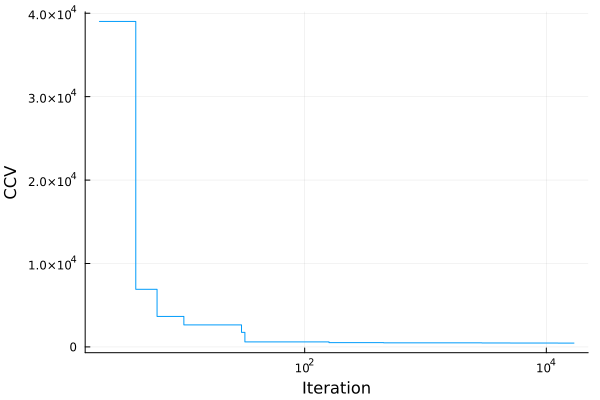

In [52]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
display(pl)

In [53]:
parfitT = zeros(16, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))
ppT = parfitT[:,bestPind]

16-element Vector{Float64}:
    48.0
    55.0
     0.006046961416247607
     0.0186434488271314
     0.06385533757413915
     0.18982762422386748
     1.0121452711094647
     2.5578976038639336
     1.6982851685345162
     0.013781252640948288
     0.9488572338568227
     0.002619254636354924
    15.0
   294.1153701312869
 12576.612579849108
   222.81504217805892

In [54]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMTRRCmp_ScF_OED3.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_OED3.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [55]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_OED3.jld2")["resMMat"][:,1]


16-element Vector{Float64}:
    48.0
    55.0
     0.006046961416247607
     0.0186434488271314
     0.06385533757413915
     0.18982762422386748
     1.0121452711094647
     2.5578976038639336
     1.6982851685345162
     0.013781252640948288
     0.9488572338568227
     0.002619254636354924
    15.0
   294.1153701312869
 12576.612579849108
   222.81504217805892

## Compute structure for Stan's initial guess

In [56]:
preTrans = zeros(13);

preTrans[1] = (ppT[3]-0.0055)/0.00275; 
preTrans[2] = (ppT[4]-0.0275)/0.01375;          
preTrans[3] = (ppT[5]-0.045)/0.0225;
preTrans[4] = (ppT[6]-0.45)/0.225;
preTrans[5] = (ppT[7]-0.95)/0.475;
preTrans[6] = (ppT[8]-0.95)/0.475;
preTrans[7] = (ppT[9]-0.95)/0.475;
preTrans[8] = (ppT[10]-0.0085)/0.00425;
preTrans[9] = (ppT[11]-0.95)/0.475;
preTrans[10] = (ppT[12]-0.0029)/0.00145;


preTrans[11] = (ppT[14]-650)/260;
preTrans[12] = (ppT[15]-16000)/6400;
preTrans[13] = (ppT[16]-550)/275;

In [57]:

samps = hcat(preTrans,preTrans,preTrans,preTrans);
namess = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

ini = genStanInitDict(samps, namess, 4)

4-element Vector{Dict{String, Any}}:
 Dict("kbnE" => 1.2426476802231263, "LDH" => -1.1897634829888768, "kin" => 0.1988950604536753, "ki" => -0.0024058234593204416, "kunE" => 1.5753371969147711, "kpl" => -0.6441128125722617, "NADH" => -1.3687870379565887, "kup" => 3.385047587081966, "kbp" => 0.13083214970413637, "kr" => -0.1936174921690177…)
 Dict("kbnE" => 1.2426476802231263, "LDH" => -1.1897634829888768, "kin" => 0.1988950604536753, "ki" => -0.0024058234593204416, "kunE" => 1.5753371969147711, "kpl" => -0.6441128125722617, "NADH" => -1.3687870379565887, "kup" => 3.385047587081966, "kbp" => 0.13083214970413637, "kr" => -0.1936174921690177…)
 Dict("kbnE" => 1.2426476802231263, "LDH" => -1.1897634829888768, "kin" => 0.1988950604536753, "ki" => -0.0024058234593204416, "kunE" => 1.5753371969147711, "kpl" => -0.6441128125722617, "NADH" => -1.3687870379565887, "kup" => 3.385047587081966, "kbp" => 0.13083214970413637, "kr" => -0.1936174921690177…)
 Dict("kbnE" => 1.2426476802231263, "LDH" => 

In [58]:
ini[1]

Dict{String, Any} with 13 entries:
  "kbnE" => 1.24265
  "LDH"  => -1.18976
  "kin"  => 0.198895
  "ki"   => -0.00240582
  "kunE" => 1.57534
  "kpl"  => -0.644113
  "NADH" => -1.36879
  "kup"  => 3.38505
  "kbp"  => 0.130832
  "kr"   => -0.193617
  "NAD"  => -0.534904
  "kun"  => -1.15632
  "kbn"  => 0.838015

## Inference

In [60]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\HP_PyrLac_CompetitiveRepressionModel_FixedT1ScF.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrCompRepr_OED3_Try2", model=Model, nchains =10,
            num_samples  = 800, num_warmup = 400, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 0.1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [61]:
rc, chns, cnames = stan(StanModel, dat, init = ini) 


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -4: 
Convergence test failures occurred too many times during one internal time step or minimum step size was reached. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessingInference/ComputationalBayesianOED/tmp/PyrCompRepr_OED3_Try2.stan', line 198, column 6 to column 133)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c

Inference for Stan model: PyrCompRepr_OED3_Try2_model
10 chains: each with iter=(800,800,800,800,800,800,800,800,800,800); warmup=(400,400,400,400,400,400,400,400,400,400); thin=(1,1,1,1,1,1,1,1,1,1); 12000 iterations saved.

Warmup took (95784, 97317, 95563, 98108, 97054, 96362, 97180, 93484, 95292, 97244) seconds, 268 hours total
Sampling took (215087, 230272, 236075, 213046, 205044, 197056, 204285, 182982, 170225, 222052) seconds, 577 hours total

                    Mean     MCSE   StdDev        5%       50%       95%    N_Eff  N_Eff/s    R_hat

lp__            -4.7e+02  4.4e-02  2.4e+00  -4.7e+02  -4.7e+02  -4.7e+02  3.2e+03  1.5e-03  1.0e+00
accept_stat__    9.4e-01  8.3e-03  1.3e-01   7.4e-01   9.9e-01   1.0e+00  2.3e+02  1.1e-04  1.0e+00
stepsize__       5.6e-03  4.2e-04  1.9e-03   2.8e-03   5.4e-03   8.9e-03  2.0e+01  9.7e-06  1.2e+00
treedepth__      9.3e+00  1.1e-01  9.0e-01   8.0e+00   9.0e+00   1.0e+01  6.5e+01  3.1e-05  1.1e+00
n_leapfrog__     7.8e+02  4.0e+01  2.8e+02  

(0, [-474.706 0.999038 … 14627.7 229.931; -474.706 0.0 … 14627.7 229.931; … ; -466.899 0.989019 … 13363.6 235.842; -468.072 0.977086 … 19845.7 223.176;;; -470.797 0.900637 … 9008.49 249.3; -470.797 0.0 … 9008.49 249.3; … ; -465.228 0.986937 … 10510.9 225.342; -466.053 0.827702 … 13647.6 234.994;;; -468.726 0.703931 … 14270.7 237.282; -468.726 0.0 … 14270.7 237.282; … ; -468.108 0.981447 … 15319.2 231.35; -466.381 0.991942 … 6673.1 221.921;;; -471.732 0.919806 … 12244.0 226.023; -471.732 0.0 … 12244.0 226.023; … ; -470.916 0.96945 … 21095.4 242.095; -471.662 0.961736 … 21879.8 241.1;;; -465.442 0.788322 … 15913.4 232.135; -465.442 0.0 … 15913.4 232.135; … ; -466.766 0.981094 … 7153.21 222.728; -467.721 0.863673 … 13505.4 224.339;;; -466.754 0.719511 … 10802.9 224.968; -466.754 0.0 … 10802.9 224.968; … ; -467.087 0.864358 … 13879.9 220.232; -467.766 0.771955 … 13418.4 225.685;;; -467.309 0.995864 … 19134.8 237.049; -467.309 0.0 … 19134.8 237.049; … ; -466.42 0.807888 … 16532.9 226.769; -

In [67]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PyrCompetitiveRepressionInferRes_OED3_Try2.jld", "rc", rc, "chns", chns, "cnames", cnames)

In [69]:
chns[401:end, end-15:end, 1]

800×16 Matrix{Float64}:
 48.0  55.0  0.00632633  0.0183237  …  15.0   594.23   12592.2   233.869
 48.0  55.0  0.00645154  0.018386      15.0   652.597  13188.7   228.993
 48.0  55.0  0.00593428  0.0181119     15.0   453.619  12810.7   221.143
 48.0  55.0  0.00675338  0.0180553     15.0   642.014  17446.9   249.579
 48.0  55.0  0.00604768  0.0180574     15.0   581.307  14741.0   223.077
 48.0  55.0  0.00650874  0.018355   …  15.0   306.177   8978.88  239.953
 48.0  55.0  0.00655407  0.0183154     15.0   482.186   6703.91  232.118
 48.0  55.0  0.00642259  0.0183043     15.0   716.044  14169.9   237.936
 48.0  55.0  0.00574095  0.018593      15.0   545.622  16075.3   213.859
 48.0  55.0  0.00625698  0.0183011     15.0   923.738  18117.2   230.735
  ⋮                                 ⋱                              ⋮
 48.0  55.0  0.00657145  0.0181538     15.0   409.53   16983.5   242.478
 48.0  55.0  0.00639757  0.0184757     15.0   569.765  20718.1   236.529
 48.0  55.0  0.00607717  0.0186

In [70]:
poster = vcat(chns[401:end, end-15:end, 1], chns[401:end, end-15:end, 2], chns[401:end, end-15:end, 3], chns[401:end, end-15:end, 4], chns[401:end, end-15:end, 5], 
              chns[401:end, end-15:end, 6], chns[401:end, end-15:end, 7], chns[401:end, end-15:end, 8], chns[401:end, end-15:end, 9], chns[401:end, end-15:end, 10])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED3_Try2.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED3_Try2.csv", DataFrame(poster, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED3_Try2.csv"

In [71]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_OED3_Try2.csv", DataFrame))

8000×16 Matrix{Float64}:
 48.0  55.0  0.00632633  0.0183237  …  15.0  594.23   12592.2   233.869
 48.0  55.0  0.00645154  0.018386      15.0  652.597  13188.7   228.993
 48.0  55.0  0.00593428  0.0181119     15.0  453.619  12810.7   221.143
 48.0  55.0  0.00675338  0.0180553     15.0  642.014  17446.9   249.579
 48.0  55.0  0.00604768  0.0180574     15.0  581.307  14741.0   223.077
 48.0  55.0  0.00650874  0.018355   …  15.0  306.177   8978.88  239.953
 48.0  55.0  0.00655407  0.0183154     15.0  482.186   6703.91  232.118
 48.0  55.0  0.00642259  0.0183043     15.0  716.044  14169.9   237.936
 48.0  55.0  0.00574095  0.018593      15.0  545.622  16075.3   213.859
 48.0  55.0  0.00625698  0.0183011     15.0  923.738  18117.2   230.735
  ⋮                                 ⋱                             ⋮
 48.0  55.0  0.00603901  0.0190663     15.0  574.314  13617.1   214.623
 48.0  55.0  0.00588336  0.0182936     15.0  684.824  22440.6   208.256
 48.0  55.0  0.00603873  0.018426      15.0

In [72]:
namess = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

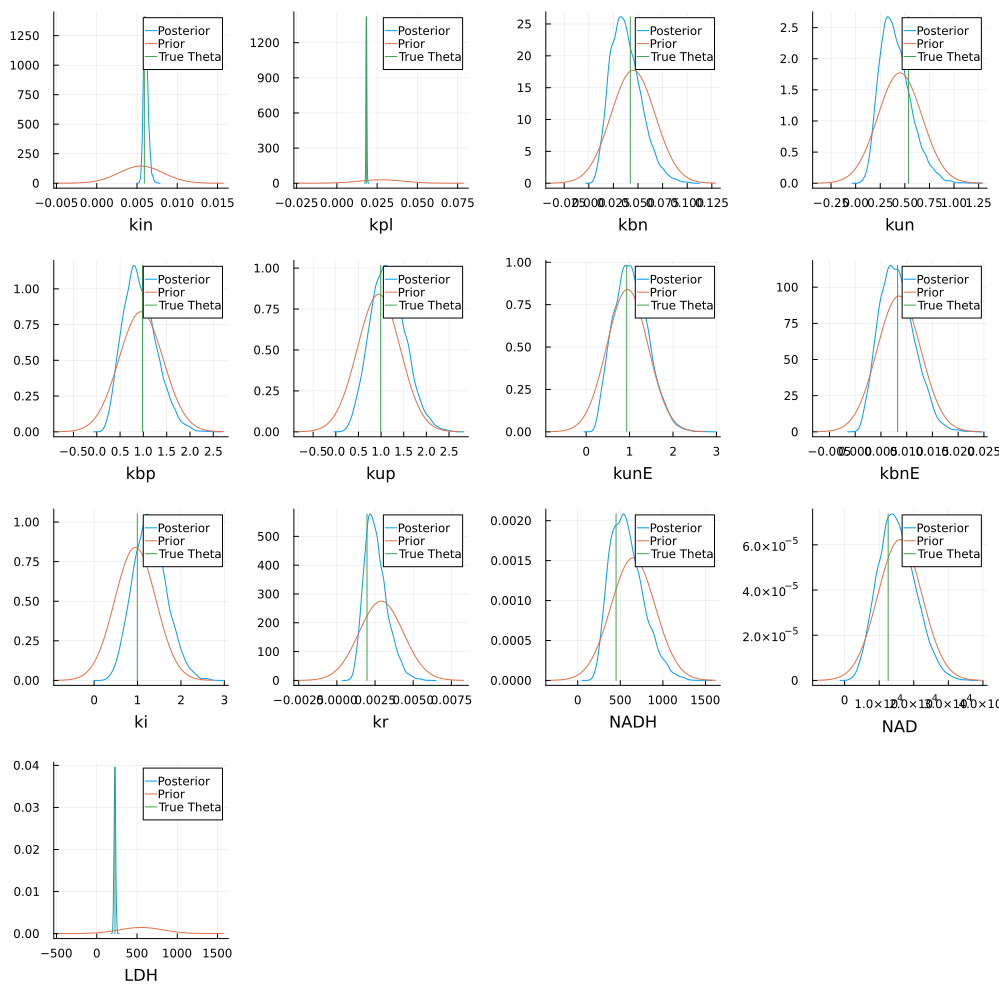

In [73]:
pp1 = plot(kde(poster[:,3]), label = "Posterior", xlabel = namess[1])
plot!(Normal(0.0055, 0.00275), label = "Prior")
plot!([trueP[3], trueP[3]],[0, maximum(kde(poster[:,3]).density)], label = "True Theta")

pp2 = plot(kde(poster[:,4]), label = "Posterior", xlabel = namess[2])
plot!(Normal(0.0275, 0.01375), label = "Prior")
plot!([trueP[4], trueP[4]],[0, maximum(kde(poster[:,4]).density)], label = "True Theta")

pp3 = plot(kde(poster[:,5]), label = "Posterior", xlabel = namess[3])
plot!(Normal(0.045, 0.0225), label = "Prior")
plot!([trueP[5], trueP[5]],[0, maximum(kde(poster[:,5]).density)], label = "True Theta")

pp4 = plot(kde(poster[:,6]), label = "Posterior", xlabel = namess[4])
plot!(Normal(0.45, 0.225), label = "Prior")
plot!([trueP[6], trueP[6]],[0, maximum(kde(poster[:,6]).density)], label = "True Theta")

pp5 = plot(kde(poster[:,7]), label = "Posterior", xlabel = namess[5])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[7], trueP[7]],[0, maximum(kde(poster[:,7]).density)], label = "True Theta")

pp6 = plot(kde(poster[:,8]), label = "Posterior", xlabel = namess[6])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[8], trueP[8]],[0, maximum(kde(poster[:,8]).density)], label = "True Theta")

pp7 = plot(kde(poster[:,9]), label = "Posterior", xlabel = namess[7])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[9], trueP[9]],[0, maximum(kde(poster[:,9]).density)], label = "True Theta")

pp8 = plot(kde(poster[:,10]), label = "Posterior", xlabel = namess[8])
plot!(Normal(0.0085, 0.00425), label = "Prior")
plot!([trueP[10], trueP[10]],[0, maximum(kde(poster[:,10]).density)], label = "True Theta")

pp9 = plot(kde(poster[:,11]), label = "Posterior", xlabel = namess[9])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[11], trueP[11]],[0, maximum(kde(poster[:,11]).density)], label = "True Theta")

pp10 = plot(kde(poster[:,12]), label = "Posterior", xlabel = namess[10])
plot!(Normal(0.0029, 0.00145), label = "Prior")
plot!([trueP[12], trueP[12]],[0, maximum(kde(poster[:,12]).density)], label = "True Theta")


pp11 = plot(kde(poster[:,14]), label = "Posterior", xlabel = namess[11])
plot!(Normal(650, 260), label = "Prior")
plot!([InitsY0[1], InitsY0[1]],[0, maximum(kde(poster[:,14]).density)], label = "True Theta")

pp12 = plot(kde(poster[:,15]), label = "Posterior", xlabel = namess[12])
plot!(Normal(16000, 6400), label = "Prior")
plot!([InitsY0[2], InitsY0[2]],[0, maximum(kde(poster[:,15]).density)], label = "True Theta")

pp13 = plot(kde(poster[:,16]), label = "Posterior", xlabel = namess[13])
plot!(Normal(550, 275), label = "Prior")
plot!([InitsY0[3], InitsY0[3]],[0, maximum(kde(poster[:,16]).density)], label = "True Theta")

plot(pp1,pp2,pp3,pp4,pp5,pp6,pp7,pp8,pp9,pp10,pp11,pp12,pp13, size=(1000,1000))

In [74]:
-log(det(cov(hcat(poster[:,3:12], poster[:,14:end]))))

54.71053396496503

## Simulate Experiment Current Posterior

In [75]:
simsPoster = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,end,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPoster[i] = SimulsAll;
end

In [76]:
# Dims = Up/Down, Observable, Experiment
PostQuant = Array{Any}(undef,2,1,1);
lacPostSims = zeros(size(simsPoster[1])[1], 8000)
[lacPostSims[:,i] = simsPoster[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PostQuant[1,k,m] = [percentile(lacPostSims[j,:], 99.5) for j in 1:size(lacPostSims)[1]]; # Up
        PostQuant[2,k,m] = [percentile(lacPostSims[j,:], 0.5 ) for j in 1:size(lacPostSims)[1]]; # Down
    end
end


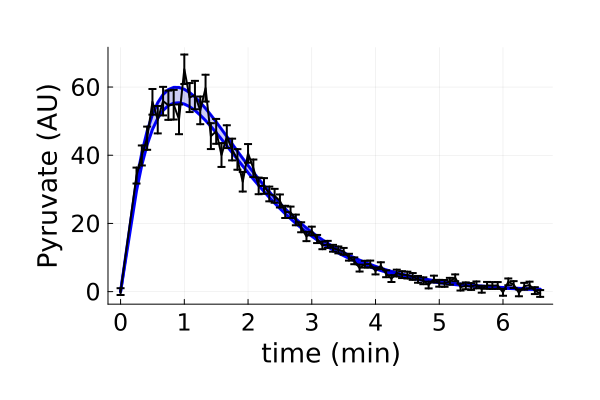

In [77]:
pr = plot(tsC2./60, PostQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PostQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PostQuant[1], fillrange=PostQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")